In [16]:
import os
import tensorflow
import tensorflow.keras
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.layers import Dense, Conv1D, Conv2D, Conv2DTranspose, Flatten, Dropout, ReLU, Input, MaxPooling1D, Reshape
from tensorflow.keras.models import Sequential, Model
import tensorflow.keras.backend as K

import numpy as np

LOAD DATABASES, CONCATENATE AND MIX THEM

In [17]:
rv = [54.]
nr = len(rv)



def load_and_shuffle_dbs(rv):
    paths = []
    for r in rv:
        paths.append(f"/scratch/scarpolini/databases/db_lorenz_{r:.1f}.npy")
    
    n_traj = 50000
    db = np.ndarray(shape=(nr*n_traj,2000,1))
    labels = []
    for path,r,i in zip(paths,rv,range(nr)):
        db1 = np.load(path)
        for j in range(n_traj):
            db[i*n_traj + j,:,0] = db1[j,0,:]
            labels.append(r)
    
    labels = np.array(labels)
    
    def unison_shuffled_copies(a, b):
        assert len(a) == len(b)
        p = np.random.permutation(len(a))
        return a[p], b[p]
    
    db, labels = unison_shuffled_copies(db, labels)
    return db, labels




db, labels = load_and_shuffle_dbs(rv)

PREPROCESSING

In [18]:
validation_split = 0.0

sig_len = len(db[0,:,0])
print(f"siglen: {sig_len}")
channels = 1 #len(db[0,0,:])
print(f"channels: {channels}")
n_traj = len(db[:,0,0])
print((f"n_traj: {n_traj}"))
# numero della prima traiettoria usata come validation
first_validation = n_traj #   round((1. - validation_split)*n_traj)
#  print(f"first_validation: {first_validation}")
db_train = np.ndarray(shape=(first_validation,sig_len,channels))
#db_test = np.ndarray(shape=(n_traj-first_validation,sig_len,channels))
db_train = db[:first_validation,:,0:channels]
#db_test = db[first_validation:,:,0:channels]
del db

print(db_train.shape)
#M = np.max(np.append(db_train, db_test))
#m = np.min(np.append(db_train, db_test))
M = np.max(db_train)
m = np.min(db_train)
print(M,m)
db_train = (db_train - m)/(M - m)
#db_test = (db_test - m)/(M - m)
M = np.max(db_train)
m = np.min(db_train)
print(M,m)

siglen: 2000
channels: 1
n_traj: 50000
(50000, 2000, 1)
31.27666666957781 -31.28223237314301
1.0 0.0


VISUALIZE DATA

In [19]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import numpy as np
%matplotlib inline

def plot_trajs(noise, real_trajs=None, epoch=None):
    import matplotlib.pyplot as plt
    gen_trajs = gen.predict(noise)
    
    try:
        if real_trajs==None:
            plt.figure(figsize=(18, 2))
            for i, traj in enumerate(gen_trajs):
                plt.subplot(1, 1, i+1)
                plt.plot(traj)
                #plt.axis('off')
    except:
        plt.figure(figsize=(18, 4))
        for i, traj in enumerate(gen_trajs):
            plt.subplot(2, 1, i+1)
            plt.plot(traj)
            #plt.axis('off')
        for i in range(len(gen_trajs)):
            plt.subplot(2, 1, len(gen_trajs)+i+1)
            n = round(np.random.uniform(0,len(real_trajs[:,0,0])))
            plt.plot(real_trajs[n,:,:])
            #plt.axis('off')
    plt.tight_layout()
    plt.show()
    

def plot_disc_predictions(disc, gen, batch_size, noise_dim, db):
    noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
    plt.plot(disc.predict(gen.predict(noise)), label='fake')
    plt.plot(disc.predict(db[np.random.randint(len(db[:,0,0]),size=batch_size)]), label='real')
    plt.legend()
    plt.show()

ARCHITETTURA RETE NEURALE

# Losses

In [71]:
def wasserstein_loss(y_true, y_pred):
    return K.mean(y_true * y_pred)

def metric_1(y_true, y_pred):
    return K.mean(y_true) - K.mean(y_pred)

##  -1 vera
##  +1 falsa

# Generator

In [33]:
noise_dim = 100
sig_len, channels = len(db_train[0,:,0]), len(db_train[0,0,:])
fs = (20,1) # dimensione filtro
fm = 4 # numero filtri
init_sigma = 0.2 # varianza distribuzione parametri iniziali dei kernel
mean_init = 0.03
alpha = 0.3

def create_gen():
    generator = Sequential()
    # Starting size
    d = 5
    #4x1
    generator.add(Dense(d*fm, kernel_initializer=RandomNormal(mean_init, init_sigma), input_dim=noise_dim))
    generator.add(ReLU(negative_slope=alpha))
    #20x1
    generator.add(Reshape((d, 1, fm)))
    #5x4
    generator.add(Conv2DTranspose(fm, fs, strides=(5,1), padding='same', kernel_initializer=RandomNormal(mean_init, init_sigma)))
    generator.add(ReLU(negative_slope=alpha))
    #50x4
    generator.add(Conv2DTranspose(fm, fs, strides=(5,1), padding='same', kernel_initializer=RandomNormal(mean_init, init_sigma)))
    generator.add(ReLU(negative_slope=alpha))
    #250x4
    generator.add(Conv2DTranspose(fm, fs, strides=(4,1), padding='same', kernel_initializer=RandomNormal(mean_init, init_sigma)))
    generator.add(ReLU(negative_slope=alpha))
    #2000x1
    generator.add(Conv2DTranspose(1, fs, strides=(4,1), padding='same', kernel_initializer=RandomNormal(mean_init, init_sigma)))
    generator.add(Reshape((2000, 1)))
    return generator

gen = create_gen()
gen.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 20)                2020      
_________________________________________________________________
re_lu_43 (ReLU)              (None, 20)                0         
_________________________________________________________________
reshape_12 (Reshape)         (None, 5, 1, 4)           0         
_________________________________________________________________
conv2d_transpose_24 (Conv2DT (None, 25, 1, 4)          324       
_________________________________________________________________
re_lu_44 (ReLU)              (None, 25, 1, 4)          0         
_________________________________________________________________
conv2d_transpose_25 (Conv2DT (None, 125, 1, 4)         324       
_________________________________________________________________
re_lu_45 (ReLU)              (None, 125, 1, 4)       

# Discriminatore

In [34]:
sig_len, channels = len(db_train[0,:,0]), len(db_train[0,0,:])
fs = 20 # dimensione filtro
fm = 4 # numero filtri
sigma_init = 0.2 # varianza distribuzione parametri iniziali dei kernel
mean_init = 0.0

def create_disc():
    discriminator = Sequential()
    #2000x1
    discriminator.add(Conv1D(fm, fs, strides=4, padding='same', kernel_initializer=RandomNormal(mean_init, sigma_init), input_shape=(sig_len, channels)))
    discriminator.add(ReLU())
    #250x4
    discriminator.add(Conv1D(fm, fs, strides=4, padding='same', kernel_initializer=RandomNormal(mean_init, sigma_init)))    
    discriminator.add(ReLU())
    #50x4
    discriminator.add(Conv1D(fm, fs, strides=5, padding='same', kernel_initializer=RandomNormal(mean_init, sigma_init))) 
    discriminator.add(ReLU())
    #25x4
    discriminator.add(Conv1D(fm, fs, strides=5, padding='same', kernel_initializer=RandomNormal(mean_init, sigma_init))) 
    discriminator.add(ReLU())
    #5x4
    discriminator.add(Flatten())
    #20x1
    #discriminator.add(Dense(4*fm, activation='relu'))
    #64x1
    discriminator.add(Dense(1))
    #1x1
    opt = RMSprop()
    discriminator.compile(loss=wasserstein_loss, optimizer=opt, metrics=['accuracy'])
    return discriminator

disc = create_disc()

disc.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_16 (Conv1D)           (None, 500, 4)            84        
_________________________________________________________________
re_lu_47 (ReLU)              (None, 500, 4)            0         
_________________________________________________________________
conv1d_17 (Conv1D)           (None, 125, 4)            324       
_________________________________________________________________
re_lu_48 (ReLU)              (None, 125, 4)            0         
_________________________________________________________________
conv1d_18 (Conv1D)           (None, 25, 4)             324       
_________________________________________________________________
re_lu_49 (ReLU)              (None, 25, 4)             0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 5, 4)            

### Gan

In [35]:
# Make the discriminator untrainable when we are training the generator.  This doesn't effect the discriminator by itself
disc.trainable = False

# Link the two models to create the GAN
gan_input = Input(shape=(noise_dim,))
fake_traj = gen(gan_input)
gan_output = disc(fake_traj)
gan = Model(gan_input, gan_output)
optimizer = RMSprop(lr=0.00005)
gan.compile(loss=wasserstein_loss, optimizer=optimizer)

disc.trainable = True

# Training

In [36]:
disc_losses = [0]
gen_losses = [0]

W0429 02:58:32.631617 47883039743488 training.py:2197] Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?


Epoch: 0 	 Discriminator Loss: [-66.91806, 0.306] 		 Generator Loss: -1.1490947008132935


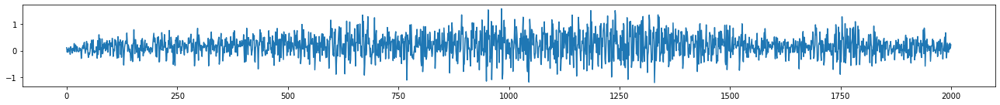

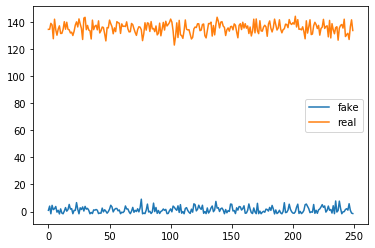

Epoch: 1 	 Discriminator Loss: [-82.41161, 0.46] 		 Generator Loss: -12.574966430664062
Epoch: 2 	 Discriminator Loss: [-73.20479, 0.474] 		 Generator Loss: -23.865062713623047
Epoch: 3 	 Discriminator Loss: [-63.76438, 0.48] 		 Generator Loss: -37.22856521606445
Epoch: 4 	 Discriminator Loss: [-52.109722, 0.49] 		 Generator Loss: -61.60166931152344
Epoch: 5 	 Discriminator Loss: [-37.32823, 0.5] 		 Generator Loss: -90.85164642333984


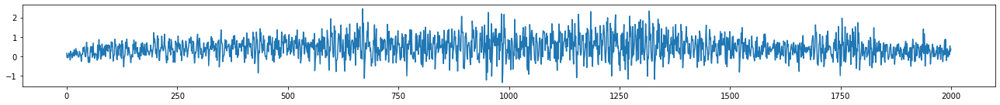

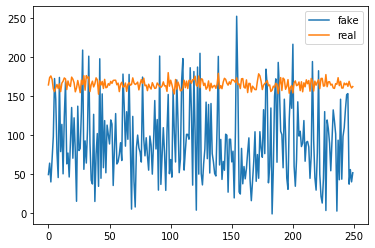

Epoch: 6 	 Discriminator Loss: [-18.102358, 0.498] 		 Generator Loss: -123.75430297851562
Epoch: 7 	 Discriminator Loss: [-19.376446, 0.358] 		 Generator Loss: -1.925565481185913
Epoch: 8 	 Discriminator Loss: [-26.111946, 0.24] 		 Generator Loss: 0.5231706500053406
Epoch: 9 	 Discriminator Loss: [-23.624102, 0.224] 		 Generator Loss: -1.1916338205337524
Epoch: 10 	 Discriminator Loss: [-20.113659, 0.346] 		 Generator Loss: -1.4931604862213135


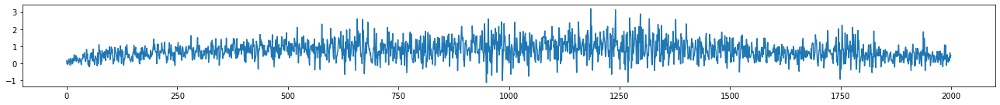

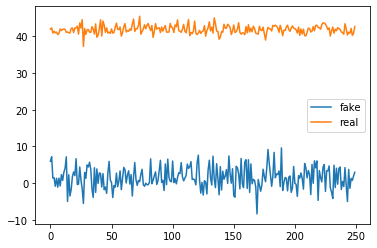

Epoch: 11 	 Discriminator Loss: [-16.903488, 0.438] 		 Generator Loss: -0.34709295630455017
Epoch: 12 	 Discriminator Loss: [-14.498566, 0.4] 		 Generator Loss: -3.8336336612701416
Epoch: 13 	 Discriminator Loss: [-13.647606, 0.35] 		 Generator Loss: -4.079769611358643
Epoch: 14 	 Discriminator Loss: [-12.32754, 0.37] 		 Generator Loss: -3.6072821617126465
Epoch: 15 	 Discriminator Loss: [-11.024962, 0.4] 		 Generator Loss: -3.4713094234466553


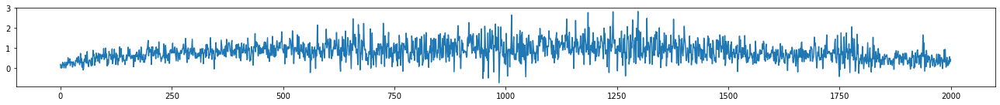

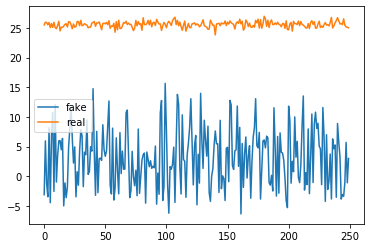

Epoch: 16 	 Discriminator Loss: [-9.692599, 0.404] 		 Generator Loss: -4.36605978012085
Epoch: 17 	 Discriminator Loss: [-8.040763, 0.276] 		 Generator Loss: -8.704405784606934
Epoch: 18 	 Discriminator Loss: [-7.3638625, 0.39] 		 Generator Loss: -7.710981845855713
Epoch: 19 	 Discriminator Loss: [-6.621118, 0.468] 		 Generator Loss: -5.86220121383667
Epoch: 20 	 Discriminator Loss: [-5.8481307, 0.486] 		 Generator Loss: -5.305638790130615


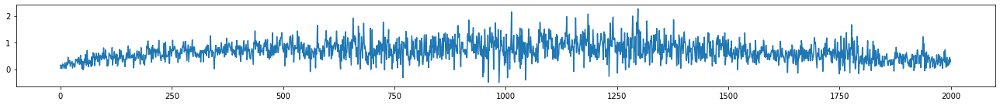

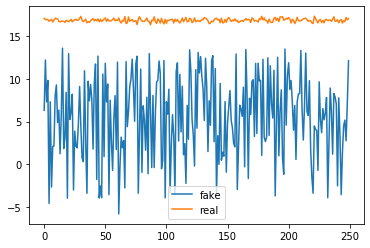

Epoch: 21 	 Discriminator Loss: [-5.0979533, 0.454] 		 Generator Loss: -11.932028770446777
Epoch: 22 	 Discriminator Loss: [-5.0623055, 0.482] 		 Generator Loss: -12.503837585449219
Epoch: 23 	 Discriminator Loss: [-5.159366, 0.5] 		 Generator Loss: -14.691343307495117
Epoch: 24 	 Discriminator Loss: [-4.798063, 0.5] 		 Generator Loss: -14.83969783782959
Epoch: 25 	 Discriminator Loss: [-4.5076714, 0.5] 		 Generator Loss: -20.54058074951172


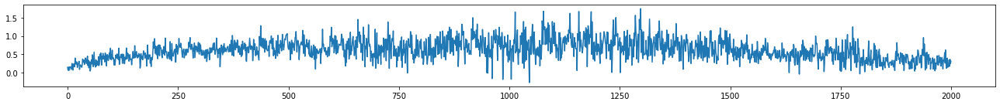

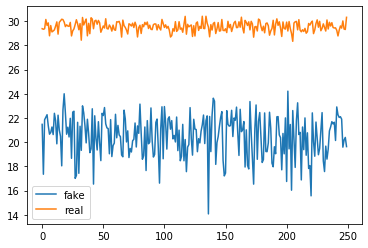

Epoch: 26 	 Discriminator Loss: [-4.068724, 0.5] 		 Generator Loss: -18.267440795898438
Epoch: 27 	 Discriminator Loss: [-4.00861, 0.5] 		 Generator Loss: -24.658687591552734
Epoch: 28 	 Discriminator Loss: [-3.75325, 0.5] 		 Generator Loss: -22.61296272277832
Epoch: 29 	 Discriminator Loss: [-3.517196, 0.5] 		 Generator Loss: -26.68074607849121
Epoch: 30 	 Discriminator Loss: [-3.3118603, 0.5] 		 Generator Loss: -24.92942237854004


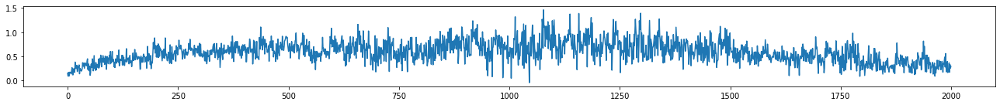

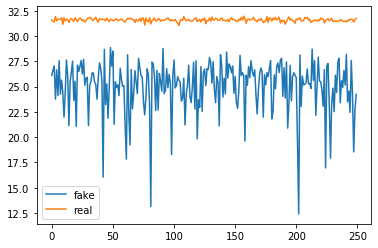

Epoch: 31 	 Discriminator Loss: [-2.9645133, 0.5] 		 Generator Loss: -24.59408187866211
Epoch: 32 	 Discriminator Loss: [-2.8367682, 0.5] 		 Generator Loss: -23.199609756469727
Epoch: 33 	 Discriminator Loss: [-2.763392, 0.5] 		 Generator Loss: -24.207393646240234
Epoch: 34 	 Discriminator Loss: [-4.7546015, 0.5] 		 Generator Loss: -8.78553295135498
Epoch: 35 	 Discriminator Loss: [-4.953217, 0.5] 		 Generator Loss: -9.643906593322754


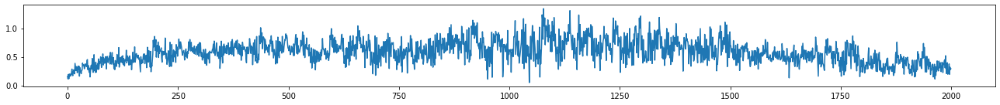

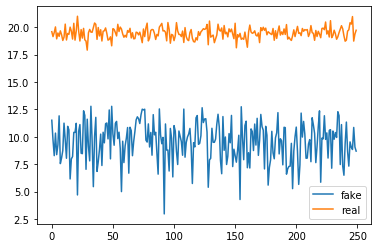

Epoch: 36 	 Discriminator Loss: [-5.1705174, 0.178] 		 Generator Loss: -3.803633213043213
Epoch: 37 	 Discriminator Loss: [-5.032505, 0.342] 		 Generator Loss: -0.447236567735672
Epoch: 38 	 Discriminator Loss: [-4.830991, 0.15] 		 Generator Loss: -1.5403473377227783
Epoch: 39 	 Discriminator Loss: [-4.644824, 0.088] 		 Generator Loss: -1.3421963453292847
Epoch: 40 	 Discriminator Loss: [-4.3290105, 0.488] 		 Generator Loss: -0.6479972004890442


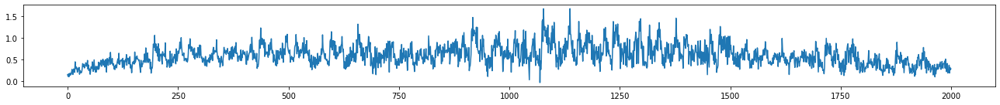

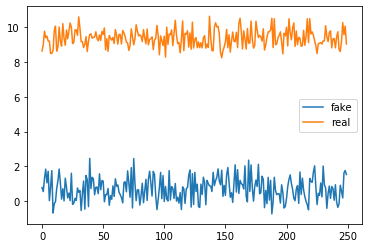

Epoch: 41 	 Discriminator Loss: [-4.046907, 0.498] 		 Generator Loss: -1.9454081058502197
Epoch: 42 	 Discriminator Loss: [-3.6492138, 0.48] 		 Generator Loss: -2.607922077178955
Epoch: 43 	 Discriminator Loss: [-3.390249, 0.5] 		 Generator Loss: -1.712936282157898
Epoch: 44 	 Discriminator Loss: [-3.105264, 0.002] 		 Generator Loss: -1.6344622373580933
Epoch: 45 	 Discriminator Loss: [-2.9560487, 0.43] 		 Generator Loss: -1.548875093460083


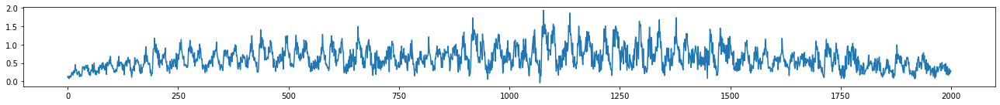

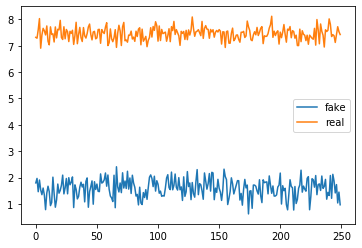

Epoch: 46 	 Discriminator Loss: [-2.7166808, 0.02] 		 Generator Loss: -2.3551318645477295
Epoch: 47 	 Discriminator Loss: [-2.662385, 0.492] 		 Generator Loss: -1.5614145994186401
Epoch: 48 	 Discriminator Loss: [-2.6713073, 0.38] 		 Generator Loss: -2.8267934322357178
Epoch: 49 	 Discriminator Loss: [-2.5412185, 0.342] 		 Generator Loss: -3.48673415184021
Epoch: 50 	 Discriminator Loss: [-1.8741939, 0.0] 		 Generator Loss: -6.405277729034424


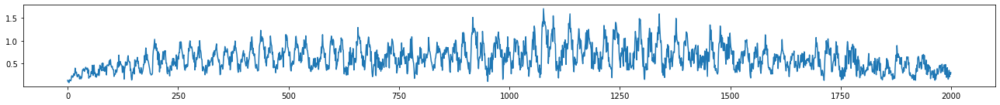

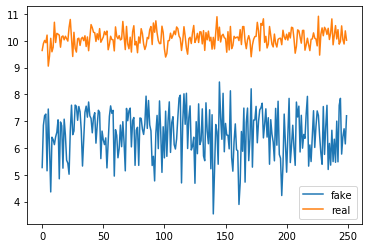

Epoch: 51 	 Discriminator Loss: [-2.0663147, 0.026] 		 Generator Loss: -5.318178176879883
Epoch: 52 	 Discriminator Loss: [-2.0632336, 0.484] 		 Generator Loss: -4.452010631561279
Epoch: 53 	 Discriminator Loss: [-2.06871, 0.494] 		 Generator Loss: -5.57967472076416
Epoch: 54 	 Discriminator Loss: [-2.2338126, 0.5] 		 Generator Loss: -6.10653829574585
Epoch: 55 	 Discriminator Loss: [-2.082838, 0.5] 		 Generator Loss: -9.726716041564941


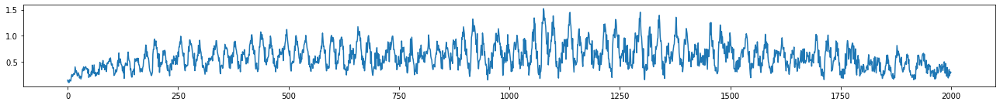

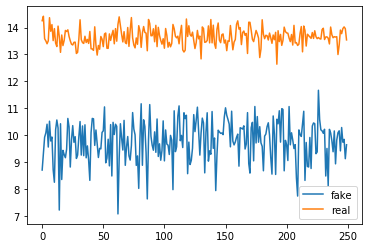

Epoch: 56 	 Discriminator Loss: [-2.3820803, 0.5] 		 Generator Loss: -3.4924399852752686
Epoch: 57 	 Discriminator Loss: [-2.4902613, 0.5] 		 Generator Loss: -5.5861735343933105
Epoch: 58 	 Discriminator Loss: [-2.6496189, 0.5] 		 Generator Loss: -4.998353958129883
Epoch: 59 	 Discriminator Loss: [-2.7550726, 0.5] 		 Generator Loss: -4.168018341064453
Epoch: 60 	 Discriminator Loss: [-2.5142424, 0.5] 		 Generator Loss: -1.5727903842926025


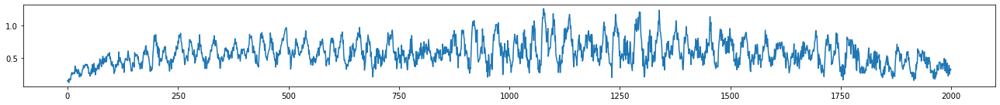

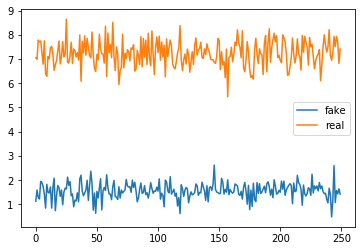

Epoch: 61 	 Discriminator Loss: [-2.8467343, 0.486] 		 Generator Loss: -0.26718834042549133
Epoch: 62 	 Discriminator Loss: [-2.9935477, 0.364] 		 Generator Loss: 0.6655008792877197
Epoch: 63 	 Discriminator Loss: [-2.8562925, 0.056] 		 Generator Loss: -1.7325408458709717
Epoch: 64 	 Discriminator Loss: [-2.8158686, 0.416] 		 Generator Loss: 0.5719675421714783
Epoch: 65 	 Discriminator Loss: [-2.1970336, 0.5] 		 Generator Loss: -1.2585242986679077


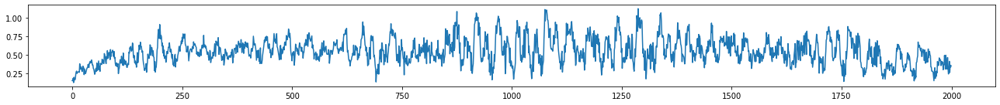

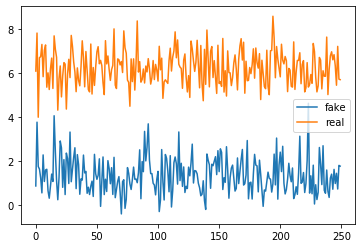

Epoch: 66 	 Discriminator Loss: [-2.3653183, 0.346] 		 Generator Loss: -0.7954684495925903
Epoch: 67 	 Discriminator Loss: [-2.145984, 0.346] 		 Generator Loss: 0.011094974353909492
Epoch: 68 	 Discriminator Loss: [-2.0507534, 0.134] 		 Generator Loss: -1.7620844841003418
Epoch: 69 	 Discriminator Loss: [-1.8671436, 0.118] 		 Generator Loss: -1.2995589971542358
Epoch: 70 	 Discriminator Loss: [-1.8637047, 0.026] 		 Generator Loss: -2.8621273040771484


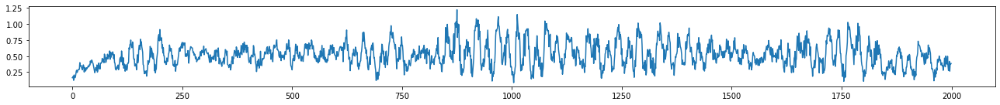

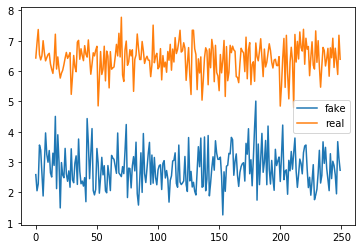

Epoch: 71 	 Discriminator Loss: [-1.9664221, 0.016] 		 Generator Loss: -1.7856042385101318
Epoch: 72 	 Discriminator Loss: [-2.0142987, 0.078] 		 Generator Loss: 0.027210723608732224
Epoch: 73 	 Discriminator Loss: [-1.9896142, 0.0] 		 Generator Loss: -1.1424505710601807
Epoch: 74 	 Discriminator Loss: [-2.05724, 0.03] 		 Generator Loss: 0.32194849848747253
Epoch: 75 	 Discriminator Loss: [-1.6104072, 0.5] 		 Generator Loss: 0.27376601099967957


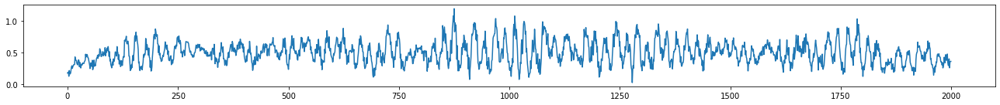

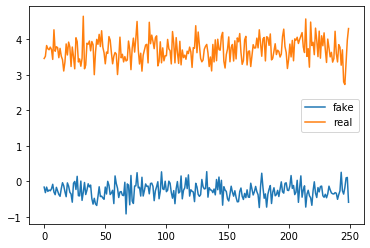

Epoch: 76 	 Discriminator Loss: [-1.9125526, 0.39] 		 Generator Loss: 0.3553085923194885
Epoch: 77 	 Discriminator Loss: [-1.1967598, 0.5] 		 Generator Loss: -4.321196556091309
Epoch: 78 	 Discriminator Loss: [-1.8766629, 0.196] 		 Generator Loss: 0.036112941801548004
Epoch: 79 	 Discriminator Loss: [-1.8816489, 0.098] 		 Generator Loss: 0.6059070825576782
Epoch: 80 	 Discriminator Loss: [-1.8603706, 0.268] 		 Generator Loss: 0.4464876353740692


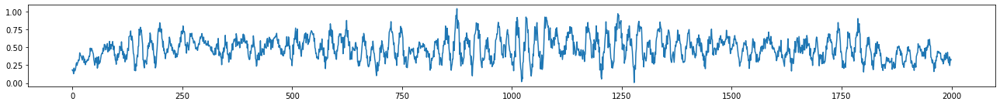

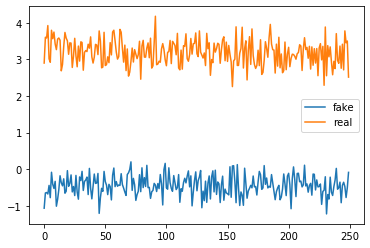

Epoch: 81 	 Discriminator Loss: [-1.8177726, 0.222] 		 Generator Loss: -0.7400226593017578
Epoch: 82 	 Discriminator Loss: [-1.2965478, 0.5] 		 Generator Loss: -4.481655597686768
Epoch: 83 	 Discriminator Loss: [-1.4560543, 0.5] 		 Generator Loss: -0.6077619791030884
Epoch: 84 	 Discriminator Loss: [-1.6693947, 0.0] 		 Generator Loss: -1.216944694519043
Epoch: 85 	 Discriminator Loss: [-1.6235359, 0.024] 		 Generator Loss: -0.9114698767662048


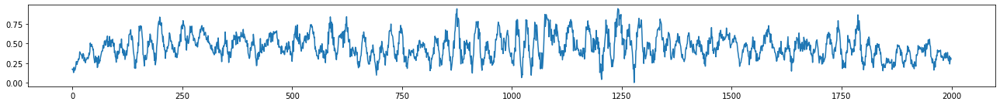

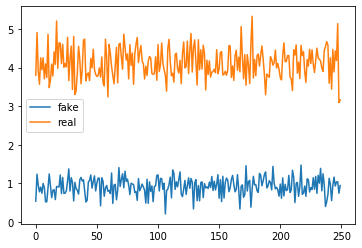

Epoch: 86 	 Discriminator Loss: [-1.5468718, 0.5] 		 Generator Loss: -0.4807606637477875
Epoch: 87 	 Discriminator Loss: [-1.4184532, 0.006] 		 Generator Loss: -3.3454904556274414
Epoch: 88 	 Discriminator Loss: [-1.010682, 0.5] 		 Generator Loss: -4.2316694259643555
Epoch: 89 	 Discriminator Loss: [-0.99297345, 0.0] 		 Generator Loss: -6.3201212882995605
Epoch: 90 	 Discriminator Loss: [-1.1784503, 0.5] 		 Generator Loss: -0.3921810984611511


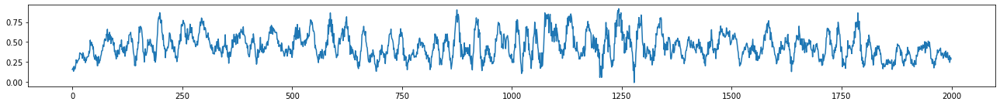

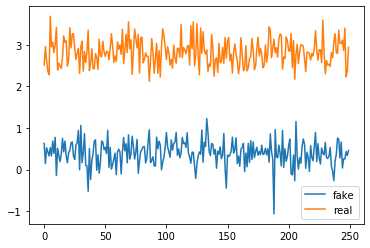

Epoch: 91 	 Discriminator Loss: [-1.0061574, 0.5] 		 Generator Loss: 1.0909372568130493
Epoch: 92 	 Discriminator Loss: [-1.0730567, 0.472] 		 Generator Loss: 0.2578091323375702
Epoch: 93 	 Discriminator Loss: [-1.1042876, 0.222] 		 Generator Loss: -0.8977699875831604
Epoch: 94 	 Discriminator Loss: [-1.0288771, 0.0] 		 Generator Loss: -2.9286766052246094
Epoch: 95 	 Discriminator Loss: [-1.0060288, 0.04] 		 Generator Loss: -1.4322460889816284


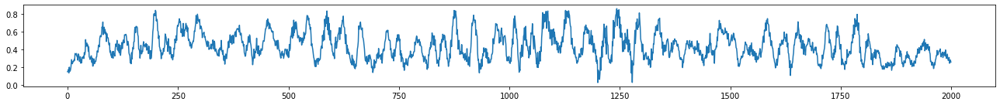

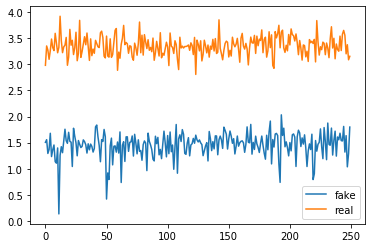

Epoch: 96 	 Discriminator Loss: [-0.92297643, 0.5] 		 Generator Loss: -0.7760406732559204
Epoch: 97 	 Discriminator Loss: [-0.95604664, 0.312] 		 Generator Loss: -1.1175626516342163
Epoch: 98 	 Discriminator Loss: [-0.87208414, 0.5] 		 Generator Loss: -0.7164649367332458
Epoch: 99 	 Discriminator Loss: [-0.9205558, 0.192] 		 Generator Loss: -1.7388185262680054
Epoch: 100 	 Discriminator Loss: [-0.84937227, 0.498] 		 Generator Loss: 0.27998265624046326


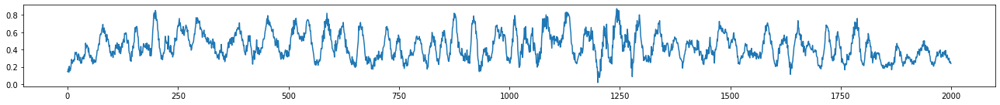

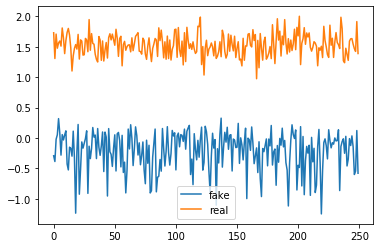

Epoch: 101 	 Discriminator Loss: [-0.85131186, 0.252] 		 Generator Loss: -1.393466830253601
Epoch: 102 	 Discriminator Loss: [-0.81776273, 0.034] 		 Generator Loss: -1.5649288892745972
Epoch: 103 	 Discriminator Loss: [-0.73076785, 0.484] 		 Generator Loss: -0.17574039101600647
Epoch: 104 	 Discriminator Loss: [-0.7974455, 0.388] 		 Generator Loss: -1.028824806213379
Epoch: 105 	 Discriminator Loss: [-0.69415504, 0.238] 		 Generator Loss: -1.321128487586975


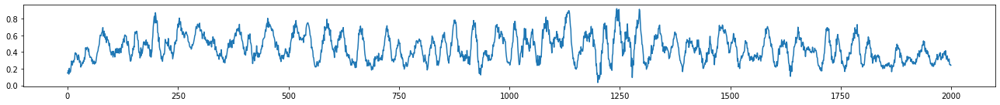

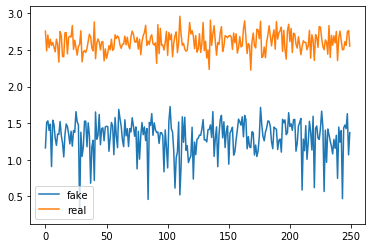

Epoch: 106 	 Discriminator Loss: [-0.66243666, 0.496] 		 Generator Loss: -0.06035030260682106
Epoch: 107 	 Discriminator Loss: [-0.6260733, 0.496] 		 Generator Loss: -0.48075351119041443
Epoch: 108 	 Discriminator Loss: [-0.64414424, 0.388] 		 Generator Loss: -1.2953969240188599
Epoch: 109 	 Discriminator Loss: [-0.3339018, 0.5] 		 Generator Loss: -4.146783828735352
Epoch: 110 	 Discriminator Loss: [-0.59838384, 0.428] 		 Generator Loss: -1.7408108711242676


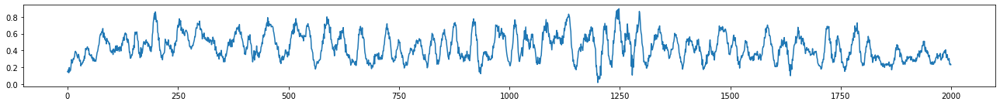

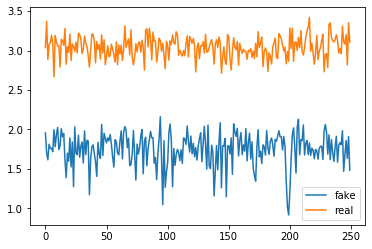

Epoch: 111 	 Discriminator Loss: [-0.3951432, 0.5] 		 Generator Loss: -2.7457172870635986
Epoch: 112 	 Discriminator Loss: [-0.6283812, 0.492] 		 Generator Loss: -0.3808498680591583
Epoch: 113 	 Discriminator Loss: [-0.55915666, 0.084] 		 Generator Loss: -1.3594025373458862
Epoch: 114 	 Discriminator Loss: [-0.3678207, 0.5] 		 Generator Loss: -2.3124191761016846
Epoch: 115 	 Discriminator Loss: [-0.15540071, 0.0] 		 Generator Loss: -4.942821025848389


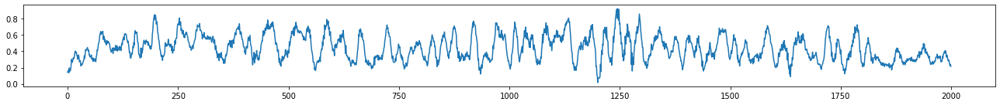

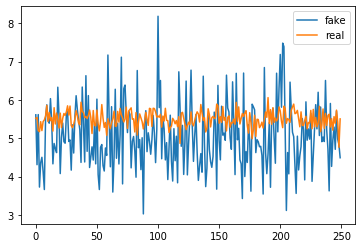

Epoch: 116 	 Discriminator Loss: [-0.56417054, 0.5] 		 Generator Loss: -0.43908724188804626


KeyboardInterrupt: 

In [37]:
def train_gan(epochs, batch_size, gen, disc, gan, train_ratio, disc_losses, gen_losses):
    clip_value = 0.1
    static_noise = np.random.normal(0, 1, size=(1, noise_dim))
    mini_batch_size = batch_size * train_ratio
    steps_per_epoch = len(db_train[:,0,0]) // batch_size
    valid = np.array([-1.]*batch_size)
    fake = np.array([1.]*batch_size)
    disc_labels = np.concatenate((valid, fake))
    for epoch in range(epochs):
            for ii in range(len(db_train[:,0,0]) // mini_batch_size):
                real_trajs = db_train[np.arange(ii*mini_batch_size, (ii+1)*mini_batch_size)]
                for jj in range(train_ratio):
                    noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
                    fake_trajs = gen.predict(noise)
                    trajs = np.concatenate((real_trajs[jj*batch_size:(jj+1)*batch_size], fake_trajs))
                    disc_losses.append(disc.train_on_batch(trajs, disc_labels)) # training del discriminatore (gli dico quali sono vere e quali no)
                    # Clip critic weights
                    for l in disc.layers:
                        weights = l.get_weights()
                        weights = [np.clip(w, -clip_value, clip_value) for w in weights]
                        l.set_weights(weights)
                
                gen_labels = np.ones(batch_size)
                gen_losses.append(gan.train_on_batch(noise, valid)) # training del generatore (per imbrogliare il discrim.)
                
                print(f'Epoch:{epoch}, batch:{ii*train_ratio+jj}/{steps_per_epoch}', end="\r")
            print(f'Epoch: {epoch} \t Discriminator Loss: {disc_losses[-1]} \t\t Generator Loss: {gen_losses[-1]}')
            if epoch%5==0:
                plot_trajs(static_noise)
                plot_disc_predictions(disc, gen, batch_size, noise_dim, db_train)

batch_size = 250
train_gan(epochs=400, batch_size=batch_size, gen=gen, disc=disc, gan=gan, train_ratio=3, disc_losses=disc_losses, gen_losses=gen_losses)

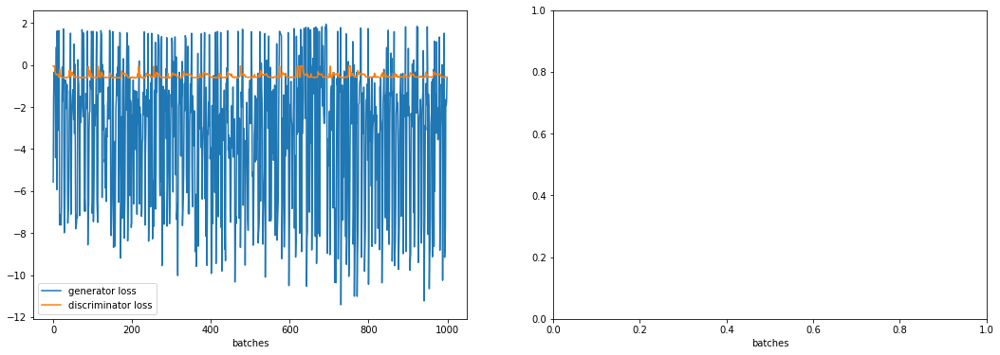

In [68]:
import matplotlib.pyplot as plt

train_ratio = 5
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(18,6))
ax1.plot(gen_losses[-1000:], label='generator loss')
ax1.plot([l[0] for l in disc_losses[-1000:]], label='discriminator loss')
ax1.set_xlabel('batches')
ax2.set_xlabel('batches')
ax1.legend()
plt.show()

Epoch: 0 	 Discriminator Loss: [-0.57274765, 0.486] 		 Generator Loss: -0.6180450320243835


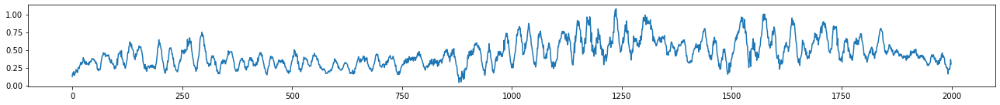

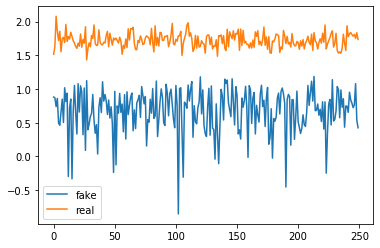

Epoch: 1 	 Discriminator Loss: [-0.3180589, 0.5] 		 Generator Loss: -4.040532112121582
Epoch: 2 	 Discriminator Loss: [-0.5707108, 0.5] 		 Generator Loss: -0.8552415370941162
Epoch: 3 	 Discriminator Loss: [-0.55952054, 0.47] 		 Generator Loss: -1.2522670030593872
Epoch: 4 	 Discriminator Loss: [-0.37604377, 0.5] 		 Generator Loss: -2.335515022277832
Epoch: 5 	 Discriminator Loss: [-0.564257, 0.5] 		 Generator Loss: -0.20305263996124268


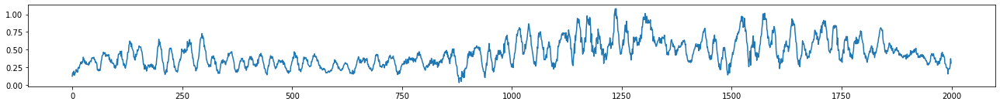

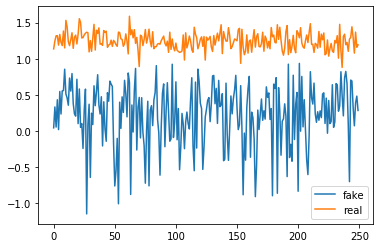

Epoch: 6 	 Discriminator Loss: [-0.6032528, 0.498] 		 Generator Loss: -0.875062108039856
Epoch: 7 	 Discriminator Loss: [-0.6625047, 0.078] 		 Generator Loss: -0.7806507349014282
Epoch: 8 	 Discriminator Loss: [-0.7201586, 0.25] 		 Generator Loss: -0.7037491202354431
Epoch: 9 	 Discriminator Loss: [-0.63837147, 0.5] 		 Generator Loss: 0.261196106672287
Epoch: 10 	 Discriminator Loss: [-0.8376659, 0.476] 		 Generator Loss: -0.5319008827209473


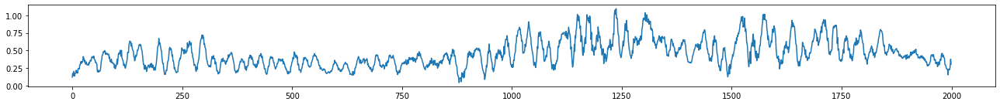

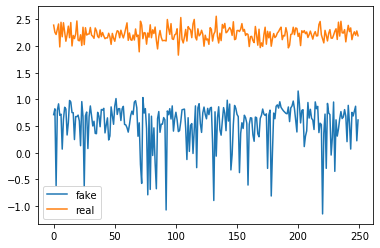

Epoch: 11 	 Discriminator Loss: [-0.8406034, 0.432] 		 Generator Loss: -0.5412701368331909
Epoch: 12 	 Discriminator Loss: [-0.85195017, 0.44] 		 Generator Loss: 0.08218026161193848
Epoch: 13 	 Discriminator Loss: [-0.8756323, 0.282] 		 Generator Loss: 0.10590676218271255
Epoch: 14 	 Discriminator Loss: [-0.83848107, 0.476] 		 Generator Loss: -0.9286088943481445
Epoch: 15 	 Discriminator Loss: [-0.8562221, 0.442] 		 Generator Loss: -0.6350931525230408


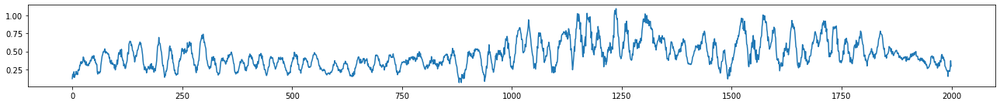

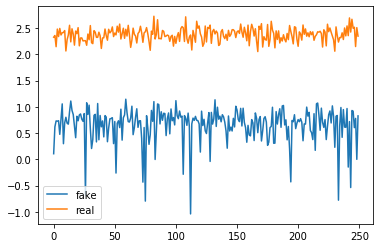

Epoch: 16 	 Discriminator Loss: [-0.60463303, 0.5] 		 Generator Loss: 0.11307846754789352
Epoch: 17 	 Discriminator Loss: [-0.3268994, 0.0] 		 Generator Loss: -5.232252597808838
Epoch: 18 	 Discriminator Loss: [-0.86734253, 0.296] 		 Generator Loss: -0.1665123701095581
Epoch: 19 	 Discriminator Loss: [-0.89228994, 0.106] 		 Generator Loss: -0.4754035770893097
Epoch: 20 	 Discriminator Loss: [-0.87823707, 0.0] 		 Generator Loss: -2.592559814453125


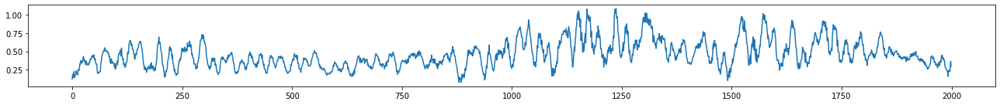

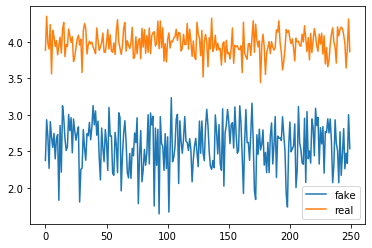

Epoch: 21 	 Discriminator Loss: [-0.5743108, 0.5] 		 Generator Loss: -3.1922359466552734
Epoch: 22 	 Discriminator Loss: [-0.82604045, 0.5] 		 Generator Loss: 0.2151135355234146
Epoch: 23 	 Discriminator Loss: [-0.8422937, 0.456] 		 Generator Loss: 0.10173383355140686
Epoch: 24 	 Discriminator Loss: [-0.82116175, 0.312] 		 Generator Loss: -0.9812564849853516
Epoch: 25 	 Discriminator Loss: [-0.78288084, 0.5] 		 Generator Loss: -1.1173065900802612


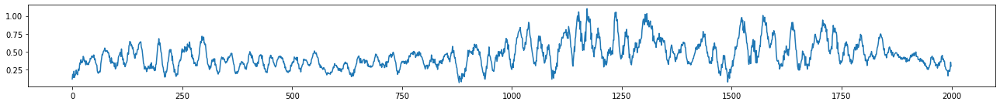

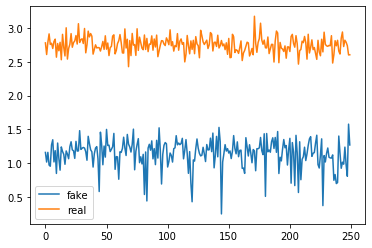

Epoch: 26 	 Discriminator Loss: [-0.7854223, 0.46] 		 Generator Loss: -1.6566768884658813
Epoch: 27 	 Discriminator Loss: [-0.78714734, 0.464] 		 Generator Loss: -0.7432576417922974
Epoch: 28 	 Discriminator Loss: [-0.7804818, 0.5] 		 Generator Loss: -0.18191193044185638
Epoch: 29 	 Discriminator Loss: [-0.7816718, 0.328] 		 Generator Loss: -0.9760748147964478
Epoch: 30 	 Discriminator Loss: [-0.7812955, 0.496] 		 Generator Loss: -0.8826191425323486


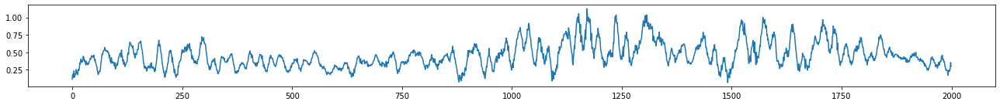

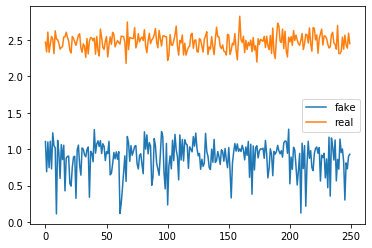

Epoch: 31 	 Discriminator Loss: [-0.77686083, 0.37] 		 Generator Loss: -1.687964916229248
Epoch: 32 	 Discriminator Loss: [-0.7859738, 0.49] 		 Generator Loss: -1.1300606727600098
Epoch: 33 	 Discriminator Loss: [-0.77436763, 0.5] 		 Generator Loss: -0.12610957026481628
Epoch: 34 	 Discriminator Loss: [-0.78284526, 0.236] 		 Generator Loss: -0.8559695482254028
Epoch: 35 	 Discriminator Loss: [-0.78942937, 0.424] 		 Generator Loss: -0.7620170712471008


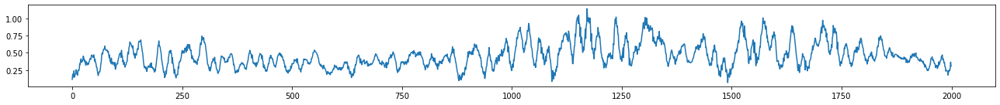

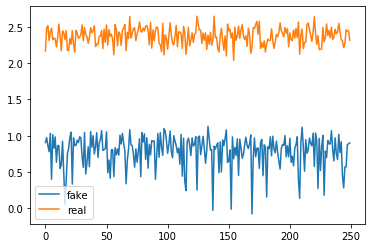

Epoch: 36 	 Discriminator Loss: [-0.80200315, 0.406] 		 Generator Loss: -0.6086583137512207
Epoch: 37 	 Discriminator Loss: [-0.80945486, 0.492] 		 Generator Loss: -0.4610513746738434
Epoch: 38 	 Discriminator Loss: [-0.29176548, 0.5] 		 Generator Loss: -5.476474761962891
Epoch: 39 	 Discriminator Loss: [-0.8031594, 0.428] 		 Generator Loss: -0.34894412755966187
Epoch: 40 	 Discriminator Loss: [-0.8211158, 0.414] 		 Generator Loss: -0.9696602821350098


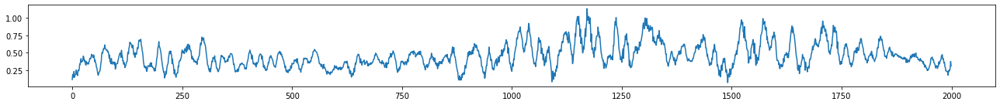

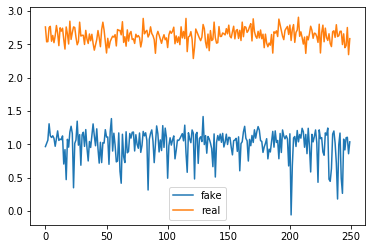

Epoch: 41 	 Discriminator Loss: [-0.79474676, 0.288] 		 Generator Loss: -1.0515434741973877
Epoch: 42 	 Discriminator Loss: [-0.79363924, 0.356] 		 Generator Loss: 0.0007227842579595745
Epoch: 43 	 Discriminator Loss: [-0.79284906, 0.386] 		 Generator Loss: -1.0070738792419434
Epoch: 44 	 Discriminator Loss: [-0.46460125, 0.5] 		 Generator Loss: -1.886716365814209
Epoch: 45 	 Discriminator Loss: [-0.7643211, 0.496] 		 Generator Loss: -1.0111024379730225


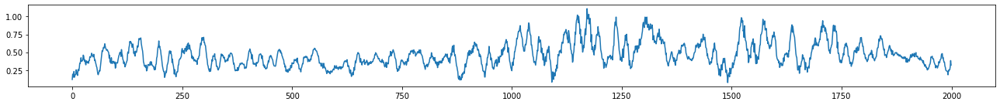

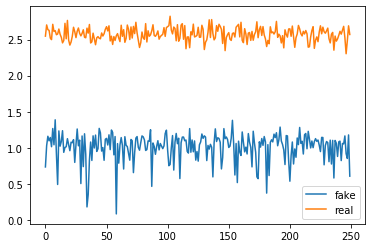

Epoch: 46 	 Discriminator Loss: [-0.6226691, 0.0] 		 Generator Loss: -5.5072126388549805
Epoch: 47 	 Discriminator Loss: [-0.6953832, 0.5] 		 Generator Loss: 0.16680990159511566
Epoch: 48 	 Discriminator Loss: [-0.7820987, 0.5] 		 Generator Loss: -0.3918534815311432
Epoch: 49 	 Discriminator Loss: [-0.79502237, 0.498] 		 Generator Loss: -0.7449522018432617
Epoch: 50 	 Discriminator Loss: [-0.7895019, 0.126] 		 Generator Loss: -1.6684801578521729


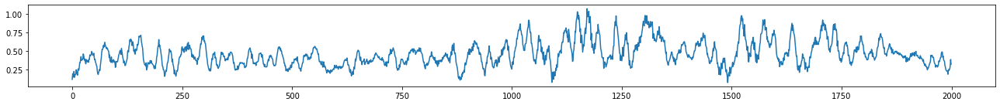

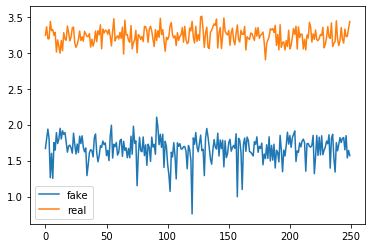

Epoch: 51 	 Discriminator Loss: [-0.8058153, 0.454] 		 Generator Loss: -0.782416582107544
Epoch: 52 	 Discriminator Loss: [-0.73837596, 0.5] 		 Generator Loss: 0.720822274684906
Epoch: 53 	 Discriminator Loss: [-0.78048676, 0.498] 		 Generator Loss: -0.9778687953948975
Epoch: 54 	 Discriminator Loss: [-0.5492462, 0.5] 		 Generator Loss: -2.195971727371216
Epoch: 55 	 Discriminator Loss: [-0.5600657, 0.0] 		 Generator Loss: -5.9846696853637695


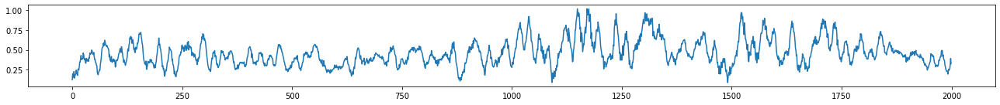

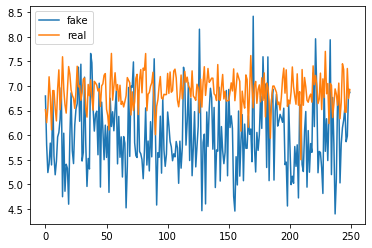

Epoch: 56 	 Discriminator Loss: [-0.58917123, 0.5] 		 Generator Loss: -2.7861719131469727
Epoch: 57 	 Discriminator Loss: [-0.7857369, 0.5] 		 Generator Loss: -0.13977432250976562
Epoch: 58 	 Discriminator Loss: [-0.7848976, 0.496] 		 Generator Loss: -0.8182793855667114
Epoch: 59 	 Discriminator Loss: [-0.23277, 0.0] 		 Generator Loss: -6.15869665145874
Epoch: 60 	 Discriminator Loss: [-0.80064696, 0.28] 		 Generator Loss: -0.9873359203338623


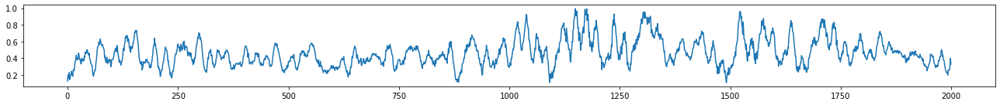

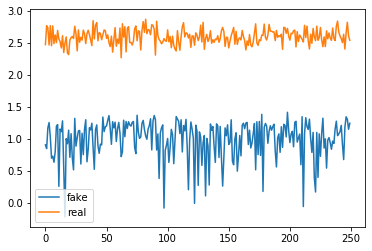

Epoch: 61 	 Discriminator Loss: [-0.55836993, 0.5] 		 Generator Loss: -3.468181610107422
Epoch: 62 	 Discriminator Loss: [-0.7567352, 0.5] 		 Generator Loss: -1.2637783288955688
Epoch: 63 	 Discriminator Loss: [-0.4914144, 0.5] 		 Generator Loss: -3.6953604221343994
Epoch: 64 	 Discriminator Loss: [-0.7420203, 0.498] 		 Generator Loss: -1.2436909675598145
Epoch: 65 	 Discriminator Loss: [-0.7389253, 0.496] 		 Generator Loss: -0.5124359130859375


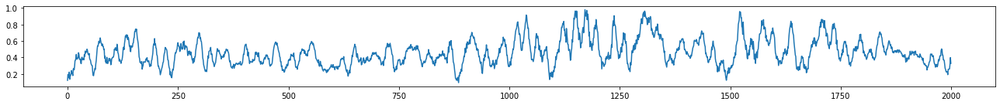

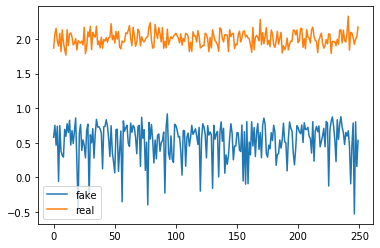

Epoch: 66 	 Discriminator Loss: [-0.4472483, 0.0] 		 Generator Loss: -6.299465179443359
Epoch: 67 	 Discriminator Loss: [-0.4489932, 0.5] 		 Generator Loss: -2.0291683673858643
Epoch: 68 	 Discriminator Loss: [-0.43039373, 0.0] 		 Generator Loss: -6.147010803222656
Epoch: 69 	 Discriminator Loss: [-0.7232489, 0.488] 		 Generator Loss: -0.6442492604255676
Epoch: 70 	 Discriminator Loss: [-0.35284925, 0.5] 		 Generator Loss: -4.074066638946533


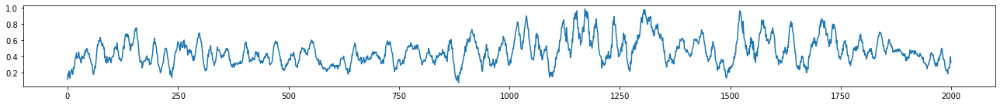

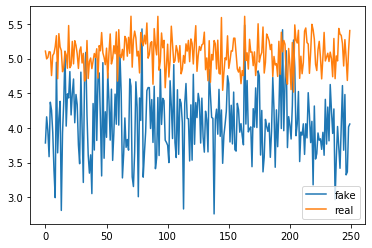

Epoch: 71 	 Discriminator Loss: [-0.62141126, 0.5] 		 Generator Loss: 0.676986575126648
Epoch: 72 	 Discriminator Loss: [-0.52502936, 0.5] 		 Generator Loss: -2.0232326984405518
Epoch: 73 	 Discriminator Loss: [-0.725781, 0.458] 		 Generator Loss: -0.7710951566696167
Epoch: 74 	 Discriminator Loss: [-0.5505373, 0.5] 		 Generator Loss: -0.7942213416099548
Epoch: 75 	 Discriminator Loss: [-0.4446997, 0.5] 		 Generator Loss: -3.6092772483825684


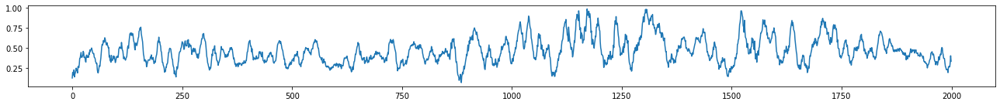

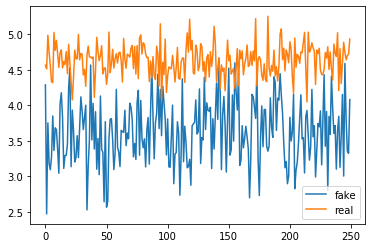

Epoch: 76 	 Discriminator Loss: [-0.7181557, 0.462] 		 Generator Loss: -0.6277828216552734
Epoch: 77 	 Discriminator Loss: [-0.7279058, 0.454] 		 Generator Loss: -0.5388381481170654
Epoch: 78 	 Discriminator Loss: [-0.69144017, 0.5] 		 Generator Loss: 0.7494584918022156
Epoch: 79 	 Discriminator Loss: [-0.7183271, 0.48] 		 Generator Loss: -0.06281066685914993
Epoch: 80 	 Discriminator Loss: [-0.7189031, 0.386] 		 Generator Loss: -0.8397392630577087


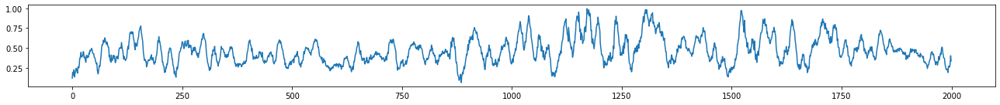

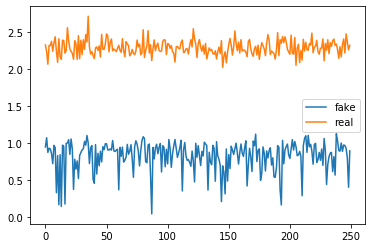

Epoch: 81 	 Discriminator Loss: [-0.7257111, 0.474] 		 Generator Loss: -0.7393820285797119
Epoch: 82 	 Discriminator Loss: [-0.697506, 0.5] 		 Generator Loss: 0.8670918941497803
Epoch: 83 	 Discriminator Loss: [-0.6496989, 0.5] 		 Generator Loss: 0.9302306771278381
Epoch: 84 	 Discriminator Loss: [-0.5874951, 0.0] 		 Generator Loss: -5.788745880126953
Epoch: 85 	 Discriminator Loss: [-0.4903891, 0.5] 		 Generator Loss: -3.3655405044555664


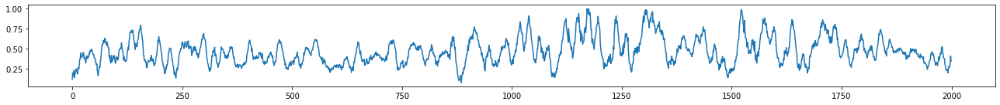

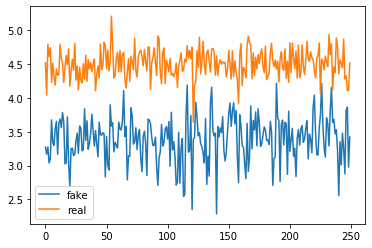

Epoch: 86 	 Discriminator Loss: [-0.68867856, 0.0] 		 Generator Loss: -3.515397310256958
Epoch: 87 	 Discriminator Loss: [-0.72158897, 0.5] 		 Generator Loss: -0.6245121359825134
Epoch: 88 	 Discriminator Loss: [-0.27019104, 0.5] 		 Generator Loss: -5.150717735290527
Epoch: 89 	 Discriminator Loss: [-0.75620204, 0.216] 		 Generator Loss: -0.5619221329689026
Epoch: 90 	 Discriminator Loss: [-0.5494207, 0.5] 		 Generator Loss: -0.8607437610626221


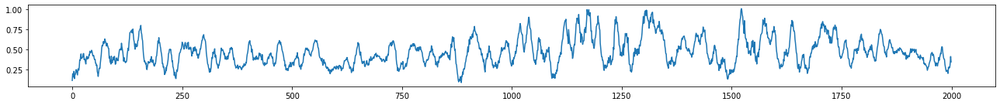

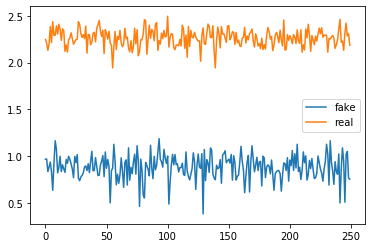

Epoch: 91 	 Discriminator Loss: [-0.7651283, 0.458] 		 Generator Loss: -1.2240302562713623
Epoch: 92 	 Discriminator Loss: [-0.3737188, 0.0] 		 Generator Loss: -6.450264930725098
Epoch: 93 	 Discriminator Loss: [-0.7652756, 0.412] 		 Generator Loss: -1.0940828323364258
Epoch: 94 	 Discriminator Loss: [-0.7340277, 0.498] 		 Generator Loss: -0.3755199909210205
Epoch: 95 	 Discriminator Loss: [-0.4962183, 0.5] 		 Generator Loss: -4.1521806716918945


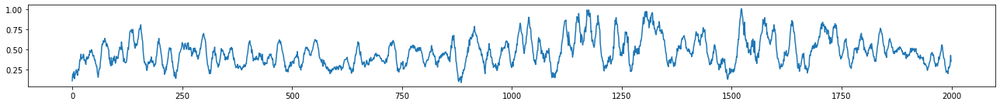

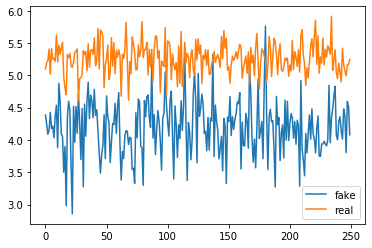

Epoch: 96 	 Discriminator Loss: [-0.7233573, 0.5] 		 Generator Loss: -0.42428383231163025
Epoch: 97 	 Discriminator Loss: [-0.73199135, 0.498] 		 Generator Loss: -0.5146867632865906
Epoch: 98 	 Discriminator Loss: [-0.69512606, 0.5] 		 Generator Loss: -1.2379131317138672
Epoch: 99 	 Discriminator Loss: [-0.512061, 0.5] 		 Generator Loss: -3.599138021469116
Epoch: 100 	 Discriminator Loss: [-0.69367164, 0.49] 		 Generator Loss: -0.4265381097793579


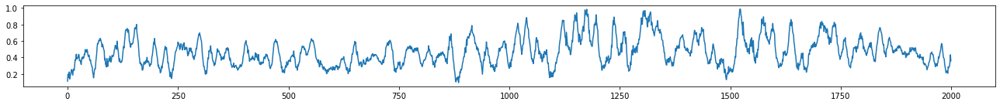

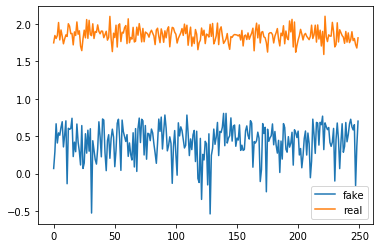

Epoch: 101 	 Discriminator Loss: [-0.703191, 0.04] 		 Generator Loss: -3.648245096206665
Epoch: 102 	 Discriminator Loss: [-0.69151235, 0.5] 		 Generator Loss: -0.883052408695221
Epoch: 103 	 Discriminator Loss: [-0.43002573, 0.5] 		 Generator Loss: -3.781257152557373
Epoch: 104 	 Discriminator Loss: [-0.68227893, 0.184] 		 Generator Loss: -2.7760307788848877
Epoch: 105 	 Discriminator Loss: [-0.70471334, 0.386] 		 Generator Loss: -1.5258249044418335


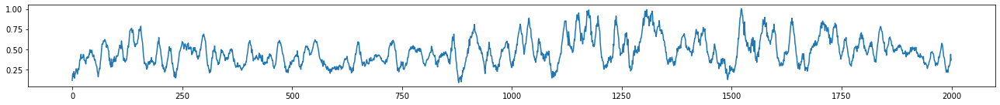

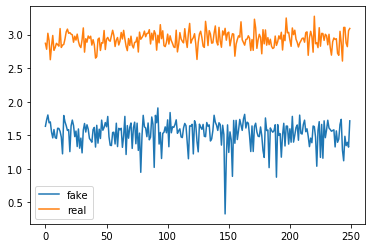

Epoch: 106 	 Discriminator Loss: [-0.6817584, 0.5] 		 Generator Loss: 0.3140670955181122
Epoch: 107 	 Discriminator Loss: [-0.50911325, 0.5] 		 Generator Loss: -1.2950745820999146
Epoch: 108 	 Discriminator Loss: [-0.7141044, 0.228] 		 Generator Loss: -1.40769362449646
Epoch: 109 	 Discriminator Loss: [-0.24304922, 0.0] 		 Generator Loss: -6.442147731781006
Epoch: 110 	 Discriminator Loss: [-0.68737686, 0.5] 		 Generator Loss: -0.7236732244491577


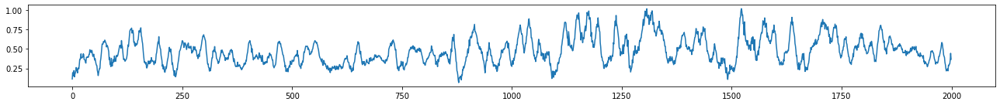

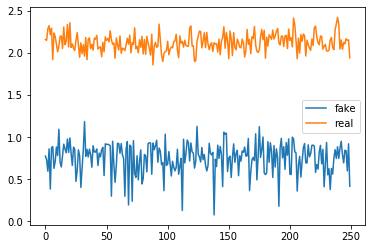

Epoch: 111 	 Discriminator Loss: [-0.6797868, 0.5] 		 Generator Loss: -1.410732388496399
Epoch: 112 	 Discriminator Loss: [-0.5327529, 0.5] 		 Generator Loss: -0.8221210837364197
Epoch: 113 	 Discriminator Loss: [-0.4627021, 0.5] 		 Generator Loss: -3.5386242866516113
Epoch: 114 	 Discriminator Loss: [-0.07939479, 0.0] 		 Generator Loss: -4.81614351272583
Epoch: 115 	 Discriminator Loss: [-0.6935842, 0.436] 		 Generator Loss: -0.05041317269206047


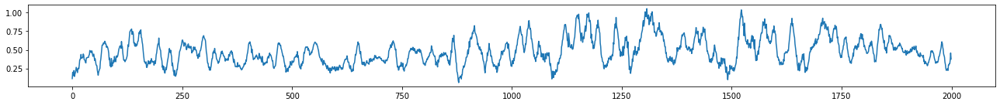

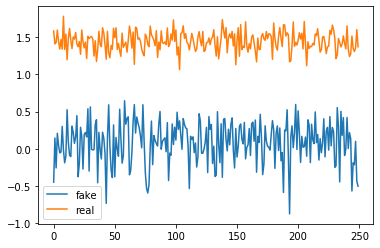

Epoch: 116 	 Discriminator Loss: [-0.5888273, 0.5] 		 Generator Loss: 0.9466328024864197
Epoch: 117 	 Discriminator Loss: [-0.7043847, 0.402] 		 Generator Loss: -0.32590267062187195
Epoch: 118 	 Discriminator Loss: [-0.6895167, 0.19] 		 Generator Loss: -0.8930486440658569
Epoch: 119 	 Discriminator Loss: [-0.68115336, 0.5] 		 Generator Loss: -0.20783008635044098
Epoch: 120 	 Discriminator Loss: [-0.60966027, 0.5] 		 Generator Loss: -1.784166693687439


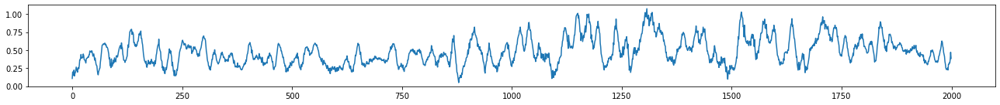

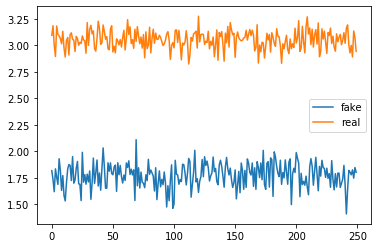

Epoch: 121 	 Discriminator Loss: [-0.6497401, 0.43] 		 Generator Loss: -0.7102289795875549
Epoch: 122 	 Discriminator Loss: [-0.6519445, 0.312] 		 Generator Loss: -0.638072669506073
Epoch: 123 	 Discriminator Loss: [-0.6196228, 0.27] 		 Generator Loss: -0.8832754492759705
Epoch: 124 	 Discriminator Loss: [-0.6227155, 0.5] 		 Generator Loss: -0.0016165304696187377
Epoch: 125 	 Discriminator Loss: [-0.64052796, 0.5] 		 Generator Loss: -0.9895281791687012


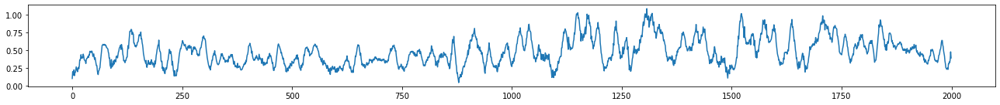

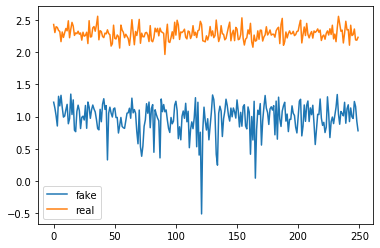

Epoch: 126 	 Discriminator Loss: [-0.540325, 0.5] 		 Generator Loss: 0.12096264958381653
Epoch: 127 	 Discriminator Loss: [-0.4675039, 0.5] 		 Generator Loss: -3.603748083114624
Epoch: 128 	 Discriminator Loss: [-0.64623797, 0.5] 		 Generator Loss: -0.3018434941768646
Epoch: 129 	 Discriminator Loss: [-0.67302024, 0.346] 		 Generator Loss: -1.8503254652023315
Epoch: 130 	 Discriminator Loss: [-0.68911695, 0.452] 		 Generator Loss: -0.2093053013086319


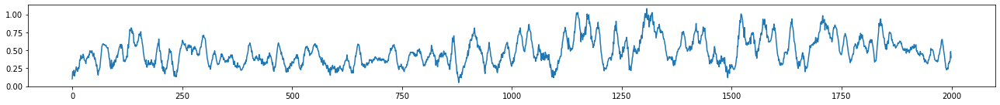

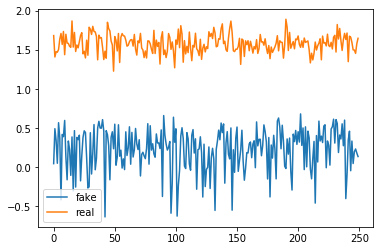

Epoch: 131 	 Discriminator Loss: [-0.57546824, 0.5] 		 Generator Loss: -0.3342147469520569
Epoch: 132 	 Discriminator Loss: [-0.439214, 0.5] 		 Generator Loss: -3.9237661361694336
Epoch: 133 	 Discriminator Loss: [-0.5431152, 0.5] 		 Generator Loss: -1.3791948556900024
Epoch: 134 	 Discriminator Loss: [-0.72207123, 0.18] 		 Generator Loss: -1.3375486135482788
Epoch: 135 	 Discriminator Loss: [-0.62947667, 0.5] 		 Generator Loss: 0.8147835731506348


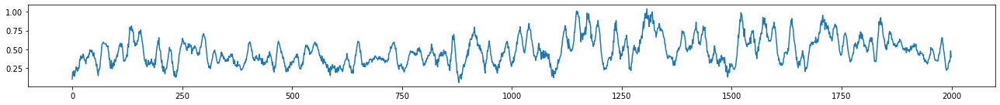

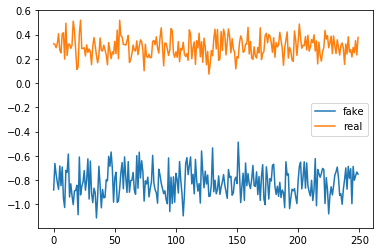

Epoch: 136 	 Discriminator Loss: [-0.63930565, 0.5] 		 Generator Loss: 0.7051478028297424
Epoch: 137 	 Discriminator Loss: [-0.71864414, 0.352] 		 Generator Loss: -0.9339842200279236
Epoch: 138 	 Discriminator Loss: [-0.67474693, 0.5] 		 Generator Loss: 0.910264790058136
Epoch: 139 	 Discriminator Loss: [-0.7143719, 0.494] 		 Generator Loss: -0.5040785670280457
Epoch: 140 	 Discriminator Loss: [-0.5537451, 0.5] 		 Generator Loss: -0.509688138961792


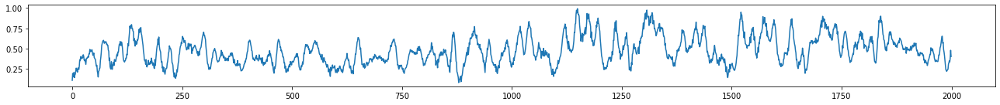

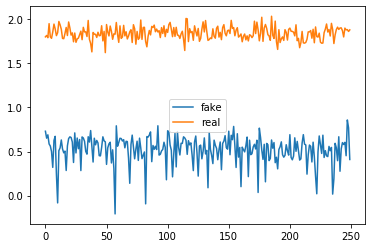

Epoch: 141 	 Discriminator Loss: [-0.65486455, 0.5] 		 Generator Loss: -1.397768497467041
Epoch: 142 	 Discriminator Loss: [-0.71598786, 0.488] 		 Generator Loss: -0.6946736574172974
Epoch: 143 	 Discriminator Loss: [-0.6714783, 0.402] 		 Generator Loss: -1.4642853736877441
Epoch: 144 	 Discriminator Loss: [-0.66647047, 0.5] 		 Generator Loss: -0.6888983249664307
Epoch: 145 	 Discriminator Loss: [-0.41507822, 0.5] 		 Generator Loss: -3.3013815879821777


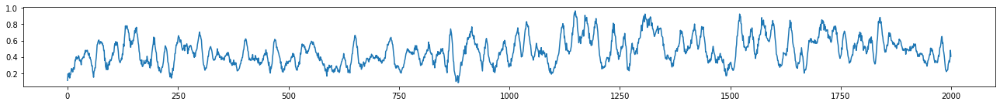

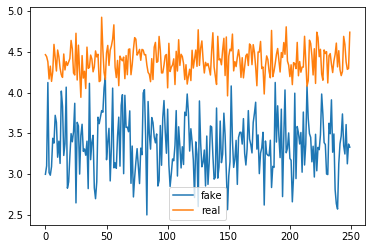

Epoch: 146 	 Discriminator Loss: [-0.662137, 0.402] 		 Generator Loss: -1.889478325843811
Epoch: 147 	 Discriminator Loss: [-0.6473618, 0.5] 		 Generator Loss: -1.242294430732727
Epoch: 148 	 Discriminator Loss: [-0.6406662, 0.5] 		 Generator Loss: -0.9112933278083801
Epoch: 149 	 Discriminator Loss: [-0.64184844, 0.5] 		 Generator Loss: -0.5174208283424377
Epoch: 150 	 Discriminator Loss: [-0.65504944, 0.314] 		 Generator Loss: -1.6211477518081665


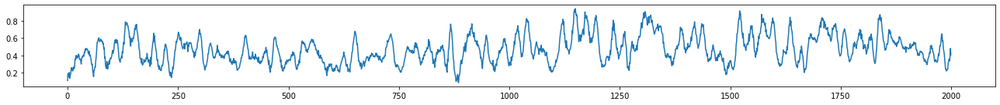

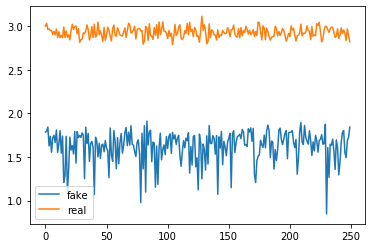

Epoch: 151 	 Discriminator Loss: [-0.6172007, 0.5] 		 Generator Loss: -1.2305113077163696
Epoch: 152 	 Discriminator Loss: [-0.65119946, 0.362] 		 Generator Loss: -1.492108941078186
Epoch: 153 	 Discriminator Loss: [-0.4673491, 0.5] 		 Generator Loss: -2.6451408863067627
Epoch: 154 	 Discriminator Loss: [-0.61308575, 0.052] 		 Generator Loss: -2.960651159286499
Epoch: 155 	 Discriminator Loss: [-0.58900416, 0.5] 		 Generator Loss: -1.99724543094635


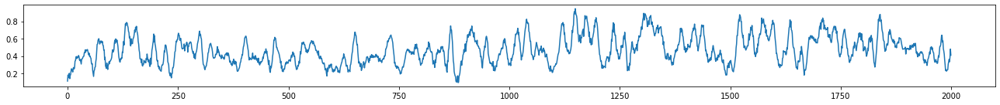

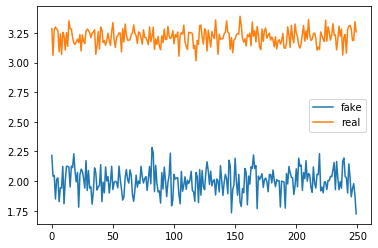

Epoch: 156 	 Discriminator Loss: [-0.52747774, 0.0] 		 Generator Loss: -5.5545654296875
Epoch: 157 	 Discriminator Loss: [-0.6178216, 0.5] 		 Generator Loss: 0.5757313966751099
Epoch: 158 	 Discriminator Loss: [-0.63645095, 0.5] 		 Generator Loss: -2.166686534881592
Epoch: 159 	 Discriminator Loss: [-0.6138342, 0.5] 		 Generator Loss: -1.9170687198638916
Epoch: 160 	 Discriminator Loss: [-0.64667773, 0.5] 		 Generator Loss: -0.933937132358551


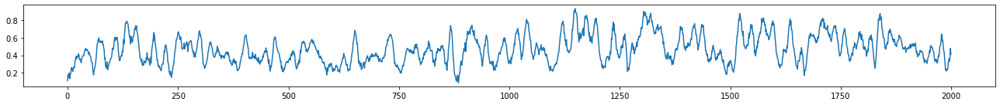

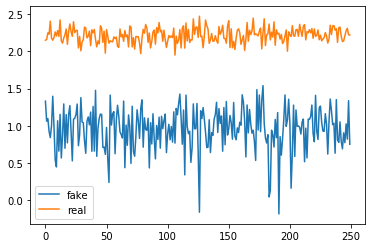

Epoch: 161 	 Discriminator Loss: [-0.60085124, 0.5] 		 Generator Loss: -1.907745122909546
Epoch: 162 	 Discriminator Loss: [-0.623856, 0.5] 		 Generator Loss: 0.878416121006012
Epoch: 163 	 Discriminator Loss: [-0.5600817, 0.006] 		 Generator Loss: -1.7274192571640015
Epoch: 164 	 Discriminator Loss: [-0.29053235, 0.5] 		 Generator Loss: -4.961129188537598
Epoch: 165 	 Discriminator Loss: [-0.64510036, 0.5] 		 Generator Loss: -1.0457154512405396


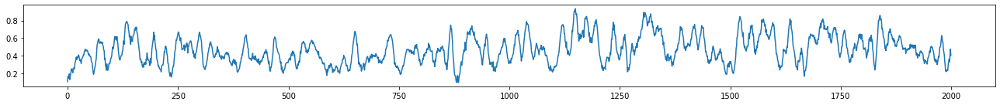

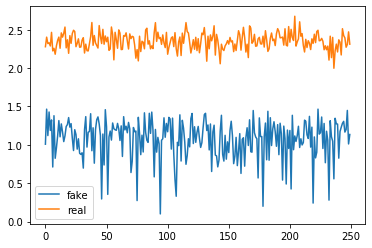

Epoch: 166 	 Discriminator Loss: [-0.6561743, 0.5] 		 Generator Loss: -0.6831780672073364
Epoch: 167 	 Discriminator Loss: [-0.6986556, 0.5] 		 Generator Loss: -1.0310665369033813
Epoch: 168 	 Discriminator Loss: [-0.71493554, 0.5] 		 Generator Loss: -0.9871317148208618
Epoch: 169 	 Discriminator Loss: [-0.43851, 0.5] 		 Generator Loss: -1.9405090808868408
Epoch: 170 	 Discriminator Loss: [-0.3599082, 0.5] 		 Generator Loss: -3.5233466625213623


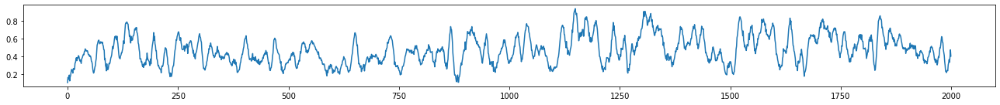

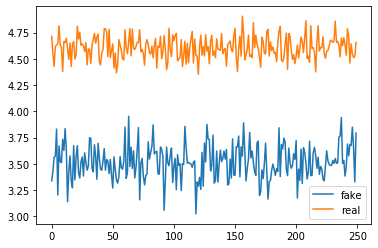

Epoch: 171 	 Discriminator Loss: [-0.6822705, 0.5] 		 Generator Loss: 0.09448099881410599
Epoch: 172 	 Discriminator Loss: [-0.43128306, 0.5] 		 Generator Loss: -2.680668830871582
Epoch: 173 	 Discriminator Loss: [-0.6524025, 0.036] 		 Generator Loss: -2.288479804992676
Epoch: 174 	 Discriminator Loss: [-0.45877528, 0.5] 		 Generator Loss: -0.27552515268325806
Epoch: 175 	 Discriminator Loss: [-0.67541486, 0.5] 		 Generator Loss: -2.253697395324707


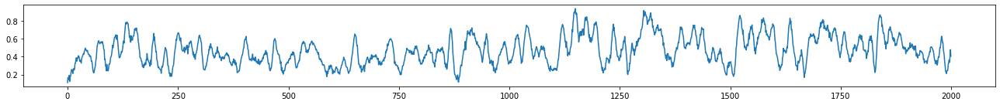

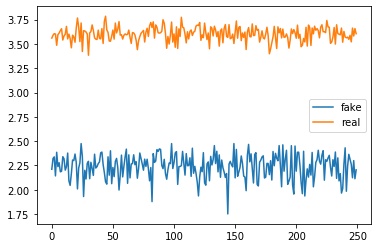

Epoch: 176 	 Discriminator Loss: [-0.65039104, 0.5] 		 Generator Loss: -2.6347973346710205
Epoch: 177 	 Discriminator Loss: [-0.64285415, 0.5] 		 Generator Loss: 0.8015300631523132
Epoch: 178 	 Discriminator Loss: [-0.65596396, 0.5] 		 Generator Loss: -1.0991891622543335
Epoch: 179 	 Discriminator Loss: [-0.64295304, 0.5] 		 Generator Loss: -1.5760891437530518
Epoch: 180 	 Discriminator Loss: [-0.571665, 0.008] 		 Generator Loss: -1.25974702835083


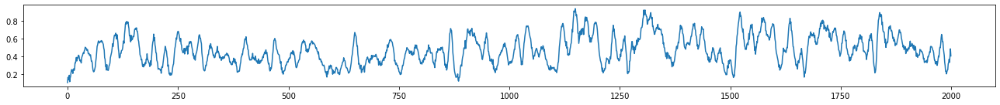

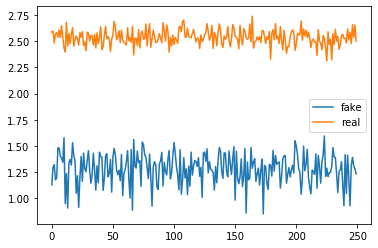

Epoch: 181 	 Discriminator Loss: [-0.6257463, 0.5] 		 Generator Loss: 0.2209576666355133
Epoch: 182 	 Discriminator Loss: [-0.35531974, 0.5] 		 Generator Loss: -3.7420620918273926
Epoch: 183 	 Discriminator Loss: [-0.5903385, 0.0] 		 Generator Loss: -3.608823537826538
Epoch: 184 	 Discriminator Loss: [-0.66917163, 0.484] 		 Generator Loss: -1.3205488920211792
Epoch: 185 	 Discriminator Loss: [-0.60920995, 0.498] 		 Generator Loss: -1.7168307304382324


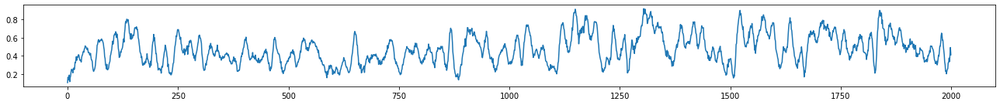

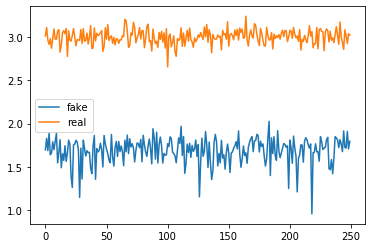

Epoch: 186 	 Discriminator Loss: [-0.6621082, 0.498] 		 Generator Loss: -1.0317795276641846
Epoch: 187 	 Discriminator Loss: [-0.665501, 0.5] 		 Generator Loss: -1.3552656173706055
Epoch: 188 	 Discriminator Loss: [-0.6352942, 0.498] 		 Generator Loss: -2.2751028537750244
Epoch: 189 	 Discriminator Loss: [-0.58718455, 0.0] 		 Generator Loss: -2.5048511028289795
Epoch: 190 	 Discriminator Loss: [-0.60100436, 0.0] 		 Generator Loss: -1.9281606674194336


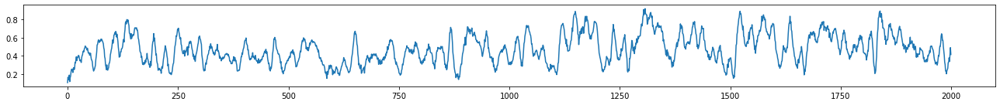

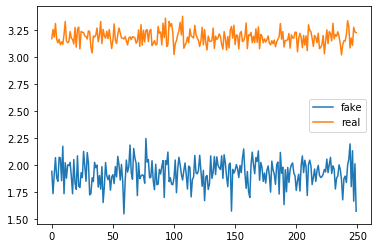

Epoch: 191 	 Discriminator Loss: [-0.2565972, 0.5] 		 Generator Loss: -5.173813343048096
Epoch: 192 	 Discriminator Loss: [-0.61846447, 0.5] 		 Generator Loss: -0.060482367873191833
Epoch: 193 	 Discriminator Loss: [-0.6343047, 0.5] 		 Generator Loss: -1.1891461610794067
Epoch: 194 	 Discriminator Loss: [-0.6066747, 0.5] 		 Generator Loss: -2.217299222946167
Epoch: 195 	 Discriminator Loss: [-0.6240577, 0.5] 		 Generator Loss: -0.7165509462356567


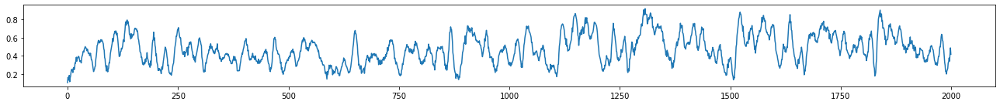

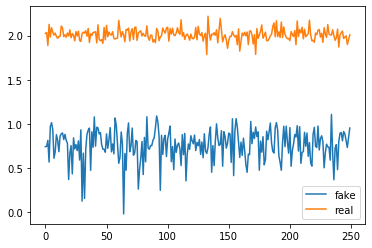

Epoch: 196 	 Discriminator Loss: [-0.20562801, 0.5] 		 Generator Loss: -5.431875705718994
Epoch: 197 	 Discriminator Loss: [-0.6289423, 0.5] 		 Generator Loss: -1.1854634284973145
Epoch: 198 	 Discriminator Loss: [-0.62047607, 0.468] 		 Generator Loss: -0.8177710175514221
Epoch: 199 	 Discriminator Loss: [-0.62564796, 0.498] 		 Generator Loss: -0.8828096985816956


In [58]:
batch_size = 250
train_gan(epochs=200, batch_size=batch_size, gen=gen, disc=disc, gan=gan, train_ratio=5, disc_losses=disc_losses, gen_losses=gen_losses)

Epoch: 0 	 Discriminator Loss: [-0.5832035, 0.124] 		 Generator Loss: -0.3457850515842438


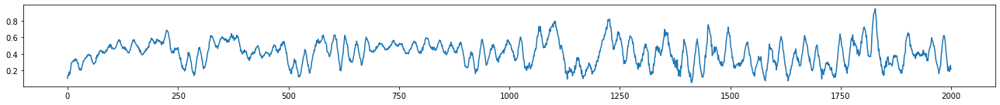

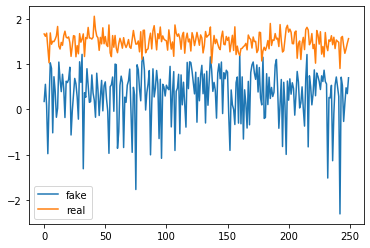

Epoch: 1 	 Discriminator Loss: [-0.55662847, 0.5] 		 Generator Loss: -2.8411757946014404
Epoch: 2 	 Discriminator Loss: [-0.5689289, 0.186] 		 Generator Loss: -0.17864078283309937
Epoch: 3 	 Discriminator Loss: [-0.42217532, 0.5] 		 Generator Loss: -4.746420860290527
Epoch: 4 	 Discriminator Loss: [-0.5063986, 0.0] 		 Generator Loss: -9.07001781463623
Epoch: 5 	 Discriminator Loss: [-0.40196282, 0.5] 		 Generator Loss: -8.822793960571289


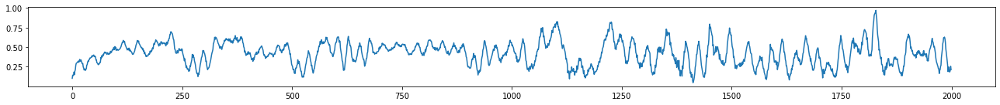

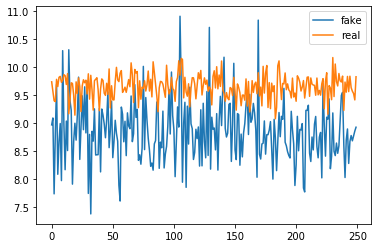

Epoch: 6 	 Discriminator Loss: [-0.526036, 0.5] 		 Generator Loss: -2.486797571182251
Epoch: 7 	 Discriminator Loss: [-0.5351039, 0.5] 		 Generator Loss: -1.4662261009216309
Epoch: 8 	 Discriminator Loss: [-0.52807975, 0.5] 		 Generator Loss: -1.9116772413253784
Epoch: 9 	 Discriminator Loss: [-0.5084536, 0.0] 		 Generator Loss: -5.908480644226074
Epoch: 10 	 Discriminator Loss: [-0.53755987, 0.39] 		 Generator Loss: -1.0764676332473755


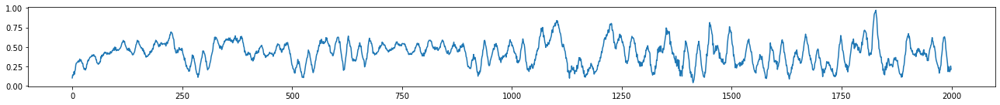

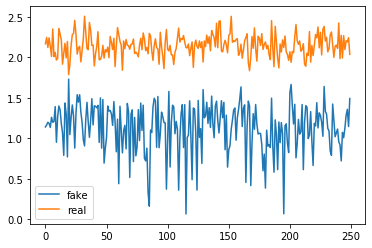

Epoch: 11 	 Discriminator Loss: [-0.5316138, 0.392] 		 Generator Loss: -0.3609561026096344
Epoch: 12 	 Discriminator Loss: [-0.49657384, 0.0] 		 Generator Loss: -6.808849334716797
Epoch: 13 	 Discriminator Loss: [-0.5432534, 0.362] 		 Generator Loss: 0.04379865154623985
Epoch: 14 	 Discriminator Loss: [-0.28976843, 0.5] 		 Generator Loss: -10.759331703186035
Epoch: 15 	 Discriminator Loss: [-0.4969604, 0.0] 		 Generator Loss: -1.5379724502563477


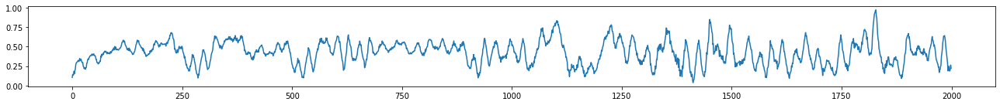

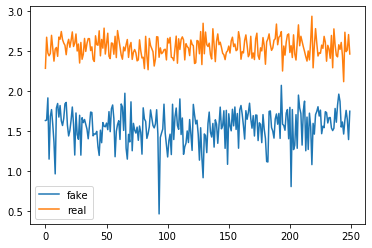

Epoch: 16 	 Discriminator Loss: [-0.5008905, 0.5] 		 Generator Loss: -1.6155232191085815
Epoch: 17 	 Discriminator Loss: [-0.5209305, 0.5] 		 Generator Loss: -0.10084456950426102
Epoch: 18 	 Discriminator Loss: [-0.5123475, 0.0] 		 Generator Loss: -5.69320821762085
Epoch: 19 	 Discriminator Loss: [-0.46539474, 0.5] 		 Generator Loss: -2.6067588329315186
Epoch: 20 	 Discriminator Loss: [-0.30492276, 0.0] 		 Generator Loss: -11.172457695007324


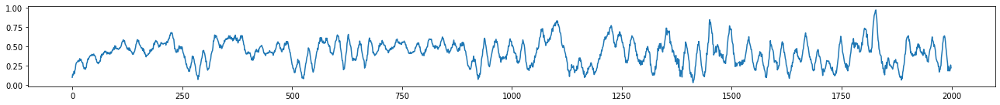

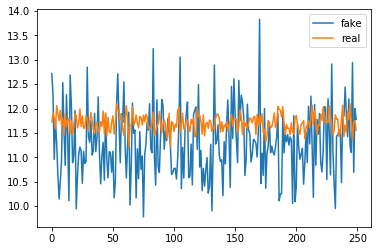

Epoch: 21 	 Discriminator Loss: [-0.4740384, 0.494] 		 Generator Loss: -2.2533159255981445
Epoch: 22 	 Discriminator Loss: [-0.4981629, 0.0] 		 Generator Loss: -1.5894355773925781
Epoch: 23 	 Discriminator Loss: [-0.497024, 0.5] 		 Generator Loss: -2.805220603942871
Epoch: 24 	 Discriminator Loss: [-0.49136788, 0.5] 		 Generator Loss: -1.3204858303070068
Epoch: 25 	 Discriminator Loss: [-0.047172617, 0.0] 		 Generator Loss: 1.8887003660202026


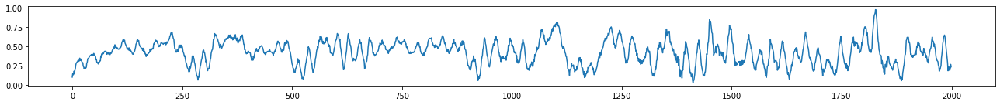

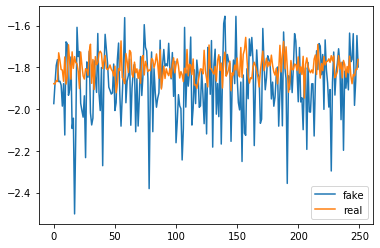

Epoch: 26 	 Discriminator Loss: [-0.39399958, 0.0] 		 Generator Loss: -10.581131935119629
Epoch: 27 	 Discriminator Loss: [-0.4996345, 0.5] 		 Generator Loss: 1.6537832021713257
Epoch: 28 	 Discriminator Loss: [-0.44302917, 0.5] 		 Generator Loss: 1.3396453857421875
Epoch: 29 	 Discriminator Loss: [-0.558676, 0.46] 		 Generator Loss: -0.9712798595428467
Epoch: 30 	 Discriminator Loss: [-0.58734435, 0.0] 		 Generator Loss: -4.694805145263672


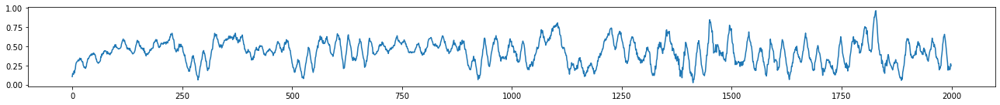

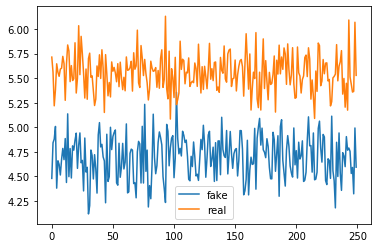

Epoch: 31 	 Discriminator Loss: [-0.3181, 0.0] 		 Generator Loss: -5.885619163513184
Epoch: 32 	 Discriminator Loss: [-0.64890724, 0.338] 		 Generator Loss: -0.7164586782455444
Epoch: 33 	 Discriminator Loss: [-0.62947315, 0.034] 		 Generator Loss: -0.8935448527336121
Epoch: 34 	 Discriminator Loss: [-0.64997965, 0.108] 		 Generator Loss: -0.4481261968612671
Epoch: 35 	 Discriminator Loss: [-0.6002859, 0.5] 		 Generator Loss: 0.03548387438058853


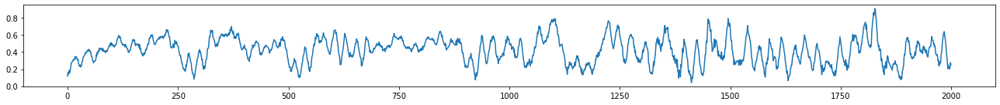

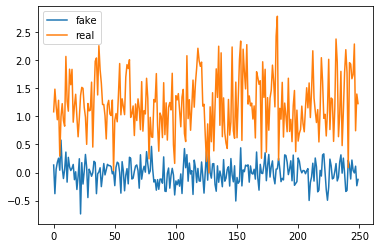

Epoch: 36 	 Discriminator Loss: [-0.70149505, 0.498] 		 Generator Loss: -1.2183879613876343
Epoch: 37 	 Discriminator Loss: [-0.655432, 0.366] 		 Generator Loss: -0.4687974750995636
Epoch: 38 	 Discriminator Loss: [-0.6115248, 0.168] 		 Generator Loss: -0.4913584589958191
Epoch: 39 	 Discriminator Loss: [-0.57711405, 0.074] 		 Generator Loss: -0.39268389344215393
Epoch: 40 	 Discriminator Loss: [-0.5368037, 0.124] 		 Generator Loss: -0.40988144278526306


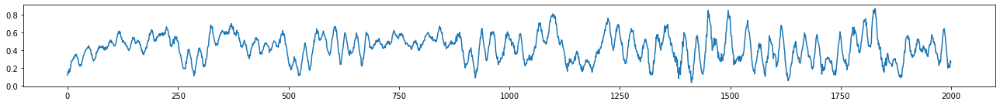

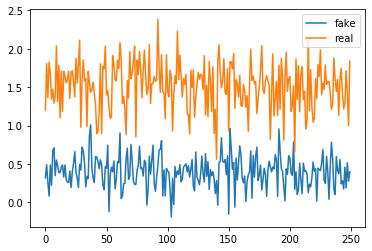

Epoch: 41 	 Discriminator Loss: [-0.5050582, 0.152] 		 Generator Loss: -0.4239904582500458
Epoch: 42 	 Discriminator Loss: [-0.35395136, 0.5] 		 Generator Loss: -2.711841583251953
Epoch: 43 	 Discriminator Loss: [-0.3484749, 0.5] 		 Generator Loss: -0.05740676075220108
Epoch: 44 	 Discriminator Loss: [-0.41155672, 0.11] 		 Generator Loss: -0.20143185555934906
Epoch: 45 	 Discriminator Loss: [-0.38225254, 0.486] 		 Generator Loss: -0.4999156594276428


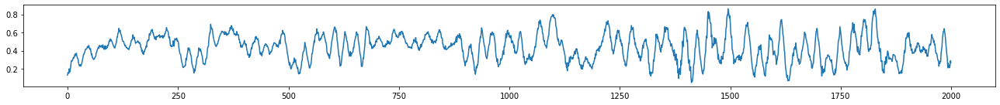

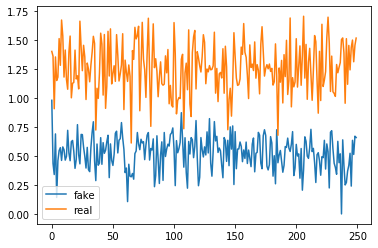

Epoch: 46 	 Discriminator Loss: [-0.28995445, 0.5] 		 Generator Loss: -2.151916742324829
Epoch: 47 	 Discriminator Loss: [-0.28428292, 0.5] 		 Generator Loss: -2.5540761947631836
Epoch: 48 	 Discriminator Loss: [-0.371672, 0.474] 		 Generator Loss: -0.3567492365837097
Epoch: 49 	 Discriminator Loss: [-0.33427683, 0.5] 		 Generator Loss: -0.12099052965641022
Epoch: 50 	 Discriminator Loss: [-0.08877901, 0.0] 		 Generator Loss: -3.4455080032348633


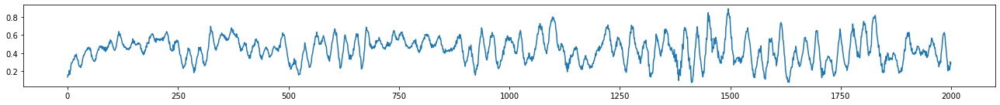

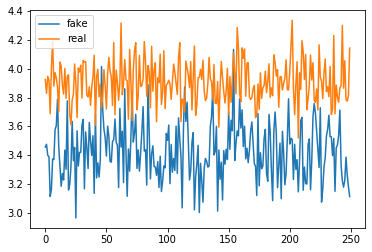

Epoch: 51 	 Discriminator Loss: [-0.33073688, 0.498] 		 Generator Loss: -1.0345765352249146
Epoch: 52 	 Discriminator Loss: [-0.24113396, 0.5] 		 Generator Loss: -3.146862506866455
Epoch: 53 	 Discriminator Loss: [-0.18492962, 0.5] 		 Generator Loss: -4.381627559661865
Epoch: 54 	 Discriminator Loss: [-0.20233402, 0.5] 		 Generator Loss: -3.3300113677978516
Epoch: 55 	 Discriminator Loss: [-0.21725467, 0.5] 		 Generator Loss: -3.8006885051727295


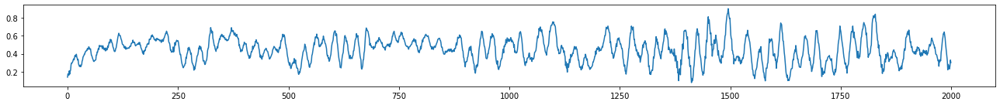

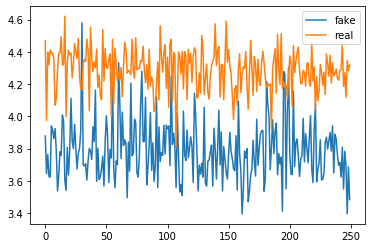

Epoch: 56 	 Discriminator Loss: [-0.3618709, 0.27] 		 Generator Loss: -0.26686495542526245
Epoch: 57 	 Discriminator Loss: [-0.31639487, 0.5] 		 Generator Loss: -3.497677803039551
Epoch: 58 	 Discriminator Loss: [-0.3219033, 0.5] 		 Generator Loss: -3.6645238399505615
Epoch: 59 	 Discriminator Loss: [-0.34372106, 0.5] 		 Generator Loss: -2.908050775527954
Epoch: 60 	 Discriminator Loss: [-0.46739435, 0.394] 		 Generator Loss: -1.1680407524108887


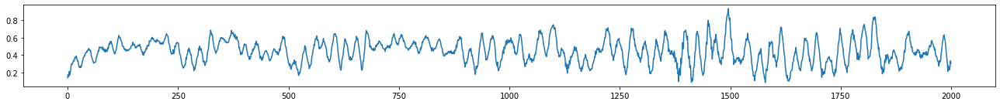

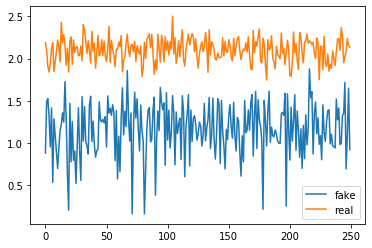

Epoch: 61 	 Discriminator Loss: [-0.37683442, 0.5] 		 Generator Loss: -4.849217891693115
Epoch: 62 	 Discriminator Loss: [-0.39015317, 0.5] 		 Generator Loss: -5.028904438018799
Epoch: 63 	 Discriminator Loss: [-0.5335094, 0.486] 		 Generator Loss: -0.8500010967254639
Epoch: 64 	 Discriminator Loss: [-0.41597694, 0.5] 		 Generator Loss: -3.96891188621521
Epoch: 65 	 Discriminator Loss: [-0.2582599, 0.5] 		 Generator Loss: -6.9834113121032715


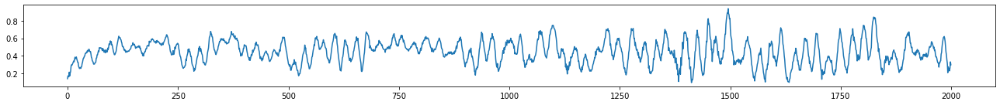

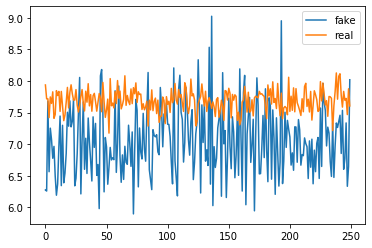

Epoch: 66 	 Discriminator Loss: [-0.53734, 0.362] 		 Generator Loss: -0.08907918632030487
Epoch: 67 	 Discriminator Loss: [-0.04104577, 0.0] 		 Generator Loss: 1.356054663658142
Epoch: 68 	 Discriminator Loss: [-0.2968229, 0.5] 		 Generator Loss: -6.630569934844971
Epoch: 69 	 Discriminator Loss: [-0.43334576, 0.5] 		 Generator Loss: -5.980345726013184
Epoch: 70 	 Discriminator Loss: [-0.582383, 0.494] 		 Generator Loss: -0.670612096786499


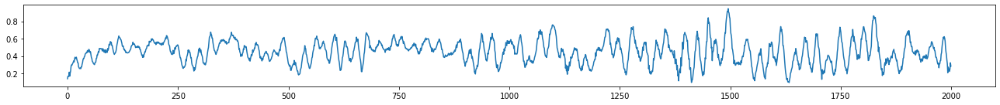

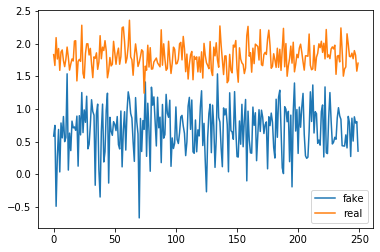

Epoch: 71 	 Discriminator Loss: [-0.5998737, 0.476] 		 Generator Loss: -0.10910629481077194
Epoch: 72 	 Discriminator Loss: [-0.46107635, 0.5] 		 Generator Loss: -5.936941623687744
Epoch: 73 	 Discriminator Loss: [-0.6171368, 0.488] 		 Generator Loss: -1.286048173904419
Epoch: 74 	 Discriminator Loss: [-0.6043279, 0.492] 		 Generator Loss: -1.2588618993759155
Epoch: 75 	 Discriminator Loss: [-0.496305, 0.5] 		 Generator Loss: -6.0315093994140625


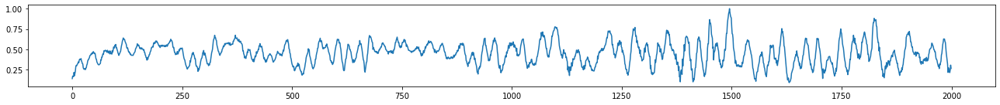

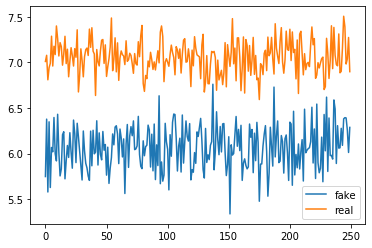

Epoch: 76 	 Discriminator Loss: [-0.64326835, 0.492] 		 Generator Loss: -1.1225569248199463
Epoch: 77 	 Discriminator Loss: [-0.50199044, 0.5] 		 Generator Loss: -6.2683186531066895
Epoch: 78 	 Discriminator Loss: [-0.3424034, 0.5] 		 Generator Loss: -8.793734550476074
Epoch: 79 	 Discriminator Loss: [-0.04915414, 0.0] 		 Generator Loss: 1.587206244468689
Epoch: 80 	 Discriminator Loss: [-0.050165404, 0.0] 		 Generator Loss: 1.574619174003601


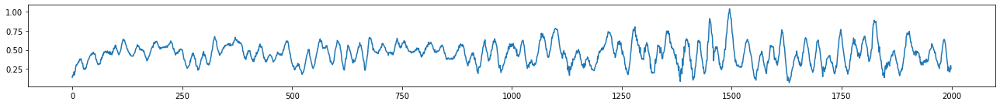

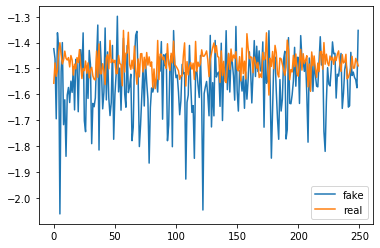

Epoch: 81 	 Discriminator Loss: [-0.6517111, 0.08] 		 Generator Loss: -2.342285633087158
Epoch: 82 	 Discriminator Loss: [-0.63024837, 0.5] 		 Generator Loss: 1.3549436330795288
Epoch: 83 	 Discriminator Loss: [-0.46506858, 0.5] 		 Generator Loss: -6.388387203216553
Epoch: 84 	 Discriminator Loss: [-0.6668803, 0.0] 		 Generator Loss: 0.49395743012428284
Epoch: 85 	 Discriminator Loss: [-0.7075046, 0.0] 		 Generator Loss: 0.29711759090423584


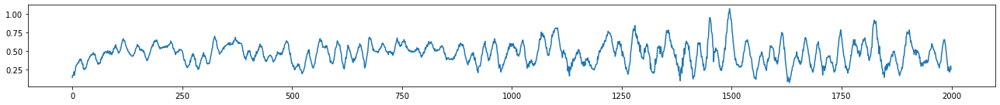

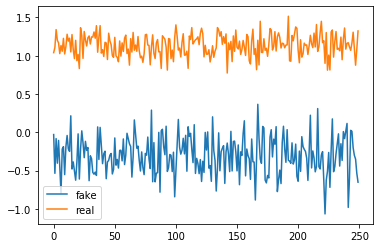

Epoch: 86 	 Discriminator Loss: [-0.7156396, 0.0] 		 Generator Loss: 1.3665646314620972
Epoch: 87 	 Discriminator Loss: [-0.72121984, 0.0] 		 Generator Loss: 0.18933330476284027
Epoch: 88 	 Discriminator Loss: [-0.6342836, 0.5] 		 Generator Loss: 0.22416259348392487
Epoch: 89 	 Discriminator Loss: [-0.50760406, 0.5] 		 Generator Loss: -4.260700225830078
Epoch: 90 	 Discriminator Loss: [-0.696084, 0.5] 		 Generator Loss: 0.9575203061103821


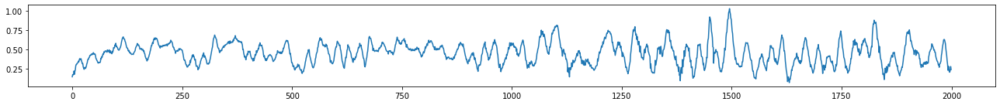

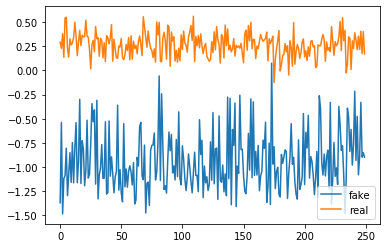

Epoch: 91 	 Discriminator Loss: [-0.50442713, 0.5] 		 Generator Loss: -5.478983402252197
Epoch: 92 	 Discriminator Loss: [-0.6645961, 0.0] 		 Generator Loss: -6.300246238708496
Epoch: 93 	 Discriminator Loss: [-0.26847625, 0.5] 		 Generator Loss: -7.443367958068848
Epoch: 94 	 Discriminator Loss: [-0.7192408, 0.344] 		 Generator Loss: -0.10476409643888474
Epoch: 95 	 Discriminator Loss: [-0.7059507, 0.5] 		 Generator Loss: -1.2375167608261108


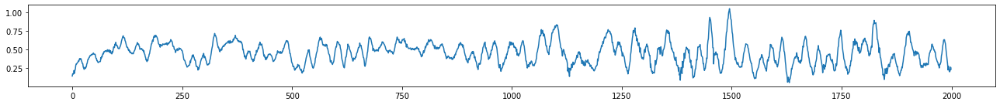

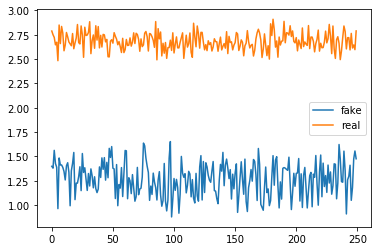

Epoch: 96 	 Discriminator Loss: [-0.4471254, 0.5] 		 Generator Loss: -5.819153785705566
Epoch: 97 	 Discriminator Loss: [-0.4009864, 0.5] 		 Generator Loss: -6.305436611175537
Epoch: 98 	 Discriminator Loss: [-0.29383403, 0.5] 		 Generator Loss: -7.8508124351501465
Epoch: 99 	 Discriminator Loss: [-0.536571, 0.5] 		 Generator Loss: -1.540400743484497
Epoch: 100 	 Discriminator Loss: [-0.7287349, 0.32] 		 Generator Loss: -0.6067929863929749


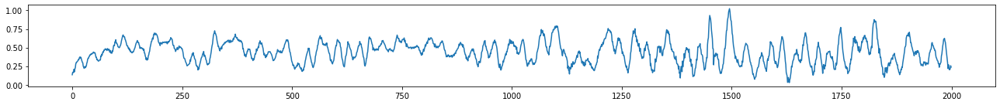

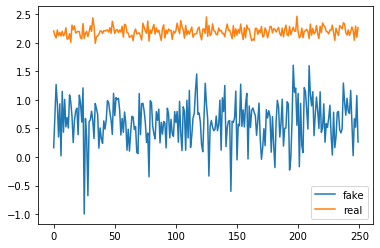

Epoch: 101 	 Discriminator Loss: [-0.44472182, 0.5] 		 Generator Loss: -7.162382125854492
Epoch: 102 	 Discriminator Loss: [-0.14223585, 0.0] 		 Generator Loss: -6.649928092956543
Epoch: 103 	 Discriminator Loss: [-0.7184345, 0.392] 		 Generator Loss: -0.7720291614532471
Epoch: 104 	 Discriminator Loss: [-0.6463595, 0.5] 		 Generator Loss: -2.9876961708068848
Epoch: 105 	 Discriminator Loss: [-0.36670163, 0.5] 		 Generator Loss: -7.668325424194336


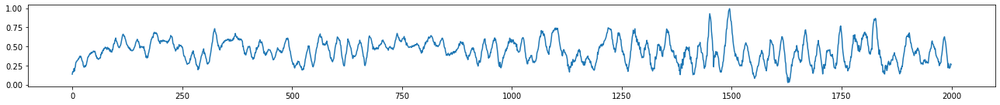

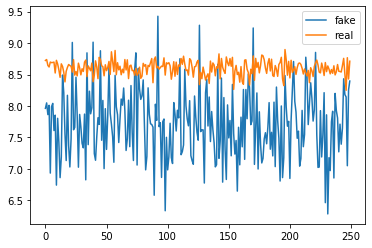

Epoch: 106 	 Discriminator Loss: [-0.58345187, 0.5] 		 Generator Loss: -2.535158634185791
Epoch: 107 	 Discriminator Loss: [-0.049035896, 0.0] 		 Generator Loss: 1.2898896932601929
Epoch: 108 	 Discriminator Loss: [-0.6746036, 0.0] 		 Generator Loss: 0.06309357285499573
Epoch: 109 	 Discriminator Loss: [-0.59829116, 0.396] 		 Generator Loss: -0.5072380304336548
Epoch: 110 	 Discriminator Loss: [-0.5827505, 0.048] 		 Generator Loss: -0.2837148904800415


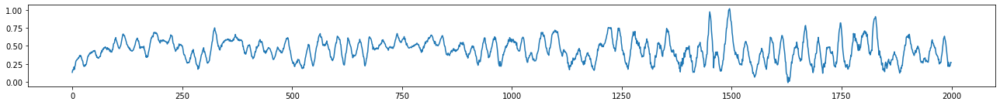

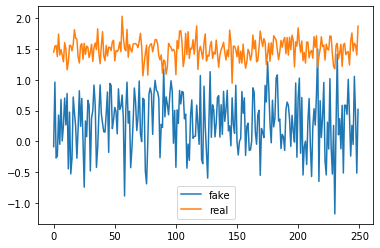

Epoch: 111 	 Discriminator Loss: [-0.61983347, 0.0] 		 Generator Loss: -7.145383834838867
Epoch: 112 	 Discriminator Loss: [-0.6577738, 0.0] 		 Generator Loss: -0.12872429192066193
Epoch: 113 	 Discriminator Loss: [-0.6741679, 0.434] 		 Generator Loss: -0.48479530215263367
Epoch: 114 	 Discriminator Loss: [-0.23485543, 0.5] 		 Generator Loss: -5.1641035079956055
Epoch: 115 	 Discriminator Loss: [-0.70166314, 0.008] 		 Generator Loss: -0.9322627186775208


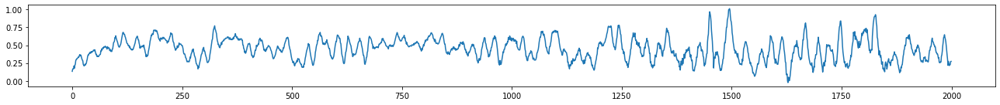

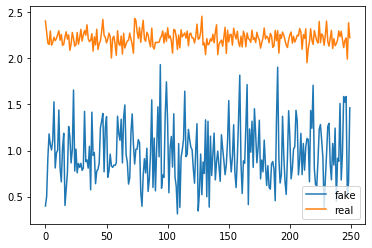

Epoch: 116 	 Discriminator Loss: [-0.620702, 0.0] 		 Generator Loss: -8.029324531555176
Epoch: 117 	 Discriminator Loss: [-0.6244331, 0.004] 		 Generator Loss: -6.617739677429199
Epoch: 118 	 Discriminator Loss: [-0.4763833, 0.5] 		 Generator Loss: -6.809712886810303
Epoch: 119 	 Discriminator Loss: [-0.739421, 0.496] 		 Generator Loss: -1.436648964881897
Epoch: 120 	 Discriminator Loss: [-0.7040288, 0.498] 		 Generator Loss: -1.8687916994094849


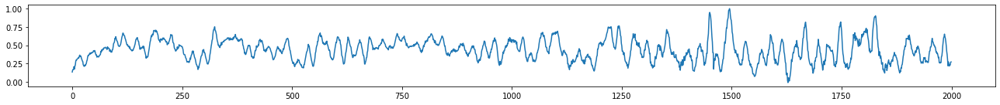

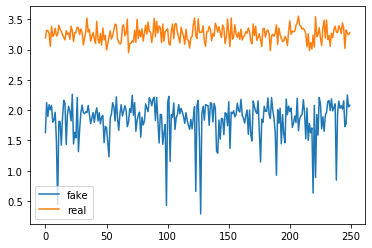

Epoch: 121 	 Discriminator Loss: [-0.68660814, 0.436] 		 Generator Loss: -0.8318208456039429
Epoch: 122 	 Discriminator Loss: [-0.3823727, 0.5] 		 Generator Loss: -6.83542013168335
Epoch: 123 	 Discriminator Loss: [-0.4844719, 0.5] 		 Generator Loss: -6.659419059753418
Epoch: 124 	 Discriminator Loss: [-0.27647454, 0.5] 		 Generator Loss: -8.56385326385498
Epoch: 125 	 Discriminator Loss: [-0.043954957, 0.0] 		 Generator Loss: 1.6124646663665771


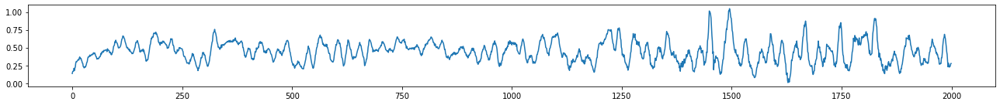

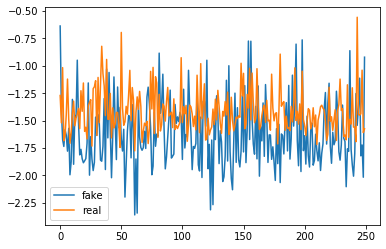

Epoch: 126 	 Discriminator Loss: [-0.5935146, 0.306] 		 Generator Loss: -6.099271774291992
Epoch: 127 	 Discriminator Loss: [-0.5981984, 0.5] 		 Generator Loss: -2.7857697010040283
Epoch: 128 	 Discriminator Loss: [-0.073570006, 0.0] 		 Generator Loss: -3.254112482070923
Epoch: 129 	 Discriminator Loss: [-0.60655004, 0.474] 		 Generator Loss: -2.8797900676727295
Epoch: 130 	 Discriminator Loss: [-0.4455325, 0.5] 		 Generator Loss: -7.4466986656188965


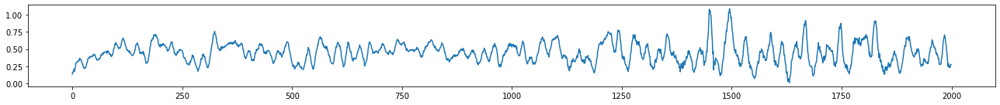

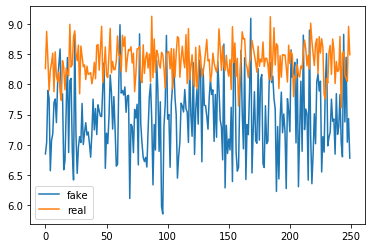

Epoch: 131 	 Discriminator Loss: [-0.59540534, 0.5] 		 Generator Loss: -3.4784297943115234
Epoch: 132 	 Discriminator Loss: [-0.5837373, 0.396] 		 Generator Loss: -4.362247943878174
Epoch: 133 	 Discriminator Loss: [-0.58787566, 0.5] 		 Generator Loss: -2.0581820011138916
Epoch: 134 	 Discriminator Loss: [-0.5783044, 0.408] 		 Generator Loss: -2.281235694885254
Epoch: 135 	 Discriminator Loss: [-0.4440124, 0.5] 		 Generator Loss: -0.7735978960990906


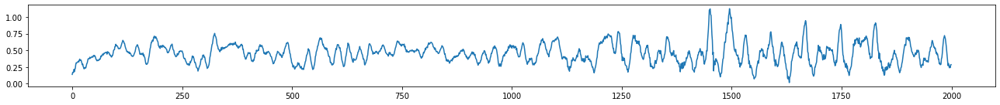

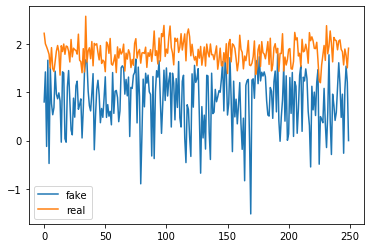

Epoch: 136 	 Discriminator Loss: [-0.032398935, 0.0] 		 Generator Loss: 1.6915812492370605
Epoch: 137 	 Discriminator Loss: [-0.53662837, 0.496] 		 Generator Loss: -2.1877098083496094
Epoch: 138 	 Discriminator Loss: [-0.322348, 0.5] 		 Generator Loss: -3.9104878902435303
Epoch: 139 	 Discriminator Loss: [-0.5173121, 0.5] 		 Generator Loss: 0.8104518055915833
Epoch: 140 	 Discriminator Loss: [-0.551372, 0.0] 		 Generator Loss: -7.638972282409668


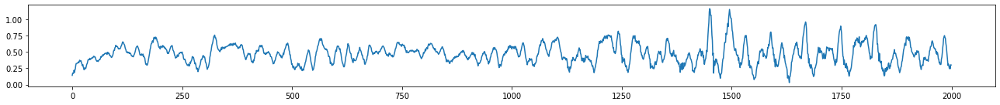

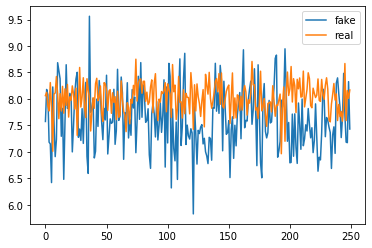

KeyboardInterrupt: 

In [69]:
batch_size = 250
train_gan(epochs=400, batch_size=batch_size, gen=gen, disc=disc, gan=gan, train_ratio=5, disc_losses=disc_losses, gen_losses=gen_losses)

Epoch: 0 	 Discriminator Loss: [-0.6766901, 0.002] 		 Generator Loss: -0.26817449927330017


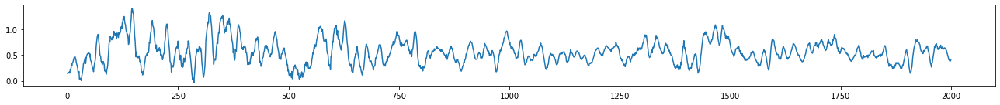

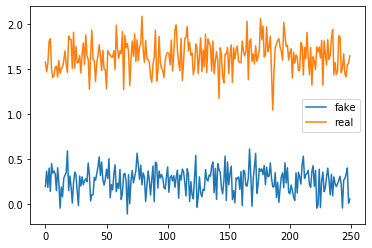

Epoch: 1 	 Discriminator Loss: [-0.68977845, 0.0] 		 Generator Loss: -0.061041440814733505
Epoch: 2 	 Discriminator Loss: [-0.4564782, 0.5] 		 Generator Loss: -2.4428298473358154
Epoch: 3 	 Discriminator Loss: [-0.077258095, 0.0] 		 Generator Loss: 1.1965975761413574
Epoch: 4 	 Discriminator Loss: [-0.6747597, 0.0] 		 Generator Loss: -0.4455103874206543
Epoch: 5 	 Discriminator Loss: [-0.646597, 0.41] 		 Generator Loss: 1.1479499340057373


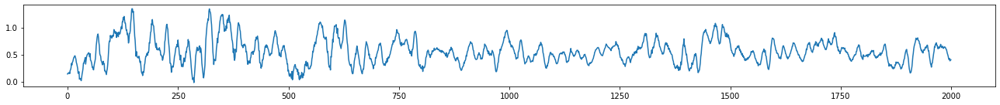

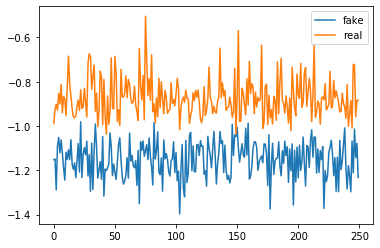

Epoch: 6 	 Discriminator Loss: [-0.62793505, 0.488] 		 Generator Loss: 1.2698484659194946
Epoch: 7 	 Discriminator Loss: [-0.66781557, 0.0] 		 Generator Loss: -0.39476215839385986
Epoch: 8 	 Discriminator Loss: [-0.48074946, 0.5] 		 Generator Loss: -0.43003472685813904
Epoch: 9 	 Discriminator Loss: [-0.43671346, 0.5] 		 Generator Loss: -2.2279534339904785
Epoch: 10 	 Discriminator Loss: [-0.46086678, 0.5] 		 Generator Loss: -2.3519582748413086


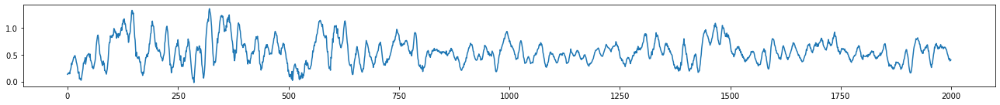

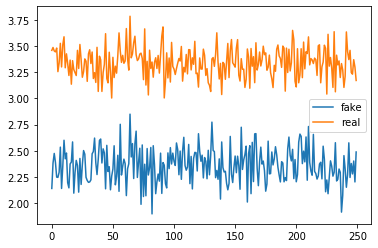

Epoch: 11 	 Discriminator Loss: [-0.44808555, 0.5] 		 Generator Loss: -2.720536947250366
Epoch: 12 	 Discriminator Loss: [-0.6844593, 0.0] 		 Generator Loss: 0.22963522374629974
Epoch: 13 	 Discriminator Loss: [-0.68044347, 0.006] 		 Generator Loss: 0.19751116633415222
Epoch: 14 	 Discriminator Loss: [-0.7021913, 0.004] 		 Generator Loss: 0.25185611844062805
Epoch: 15 	 Discriminator Loss: [-0.7006762, 0.002] 		 Generator Loss: 0.16022811830043793


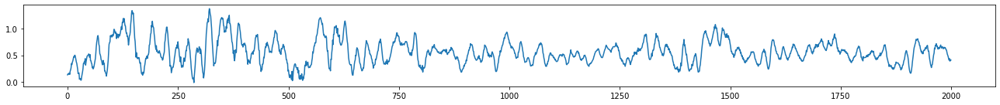

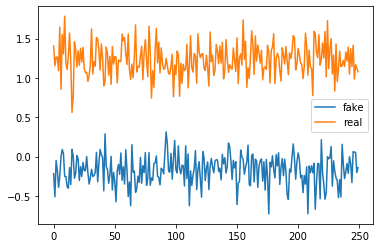

Epoch: 16 	 Discriminator Loss: [-0.6920458, 0.002] 		 Generator Loss: -0.03525381162762642
Epoch: 17 	 Discriminator Loss: [-0.70123565, 0.0] 		 Generator Loss: 0.28999829292297363
Epoch: 18 	 Discriminator Loss: [-0.70059377, 0.0] 		 Generator Loss: 0.20633378624916077
Epoch: 19 	 Discriminator Loss: [-0.6815078, 0.0] 		 Generator Loss: 0.06443528831005096
Epoch: 20 	 Discriminator Loss: [-0.4186262, 0.5] 		 Generator Loss: -2.741703748703003


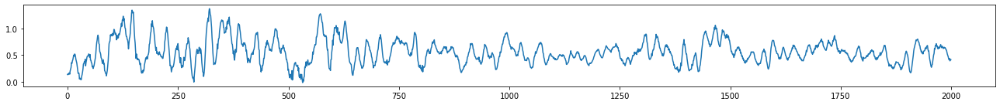

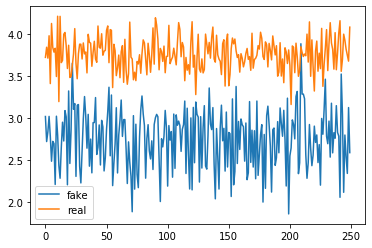

Epoch: 21 	 Discriminator Loss: [-0.6629146, 0.0] 		 Generator Loss: 0.04488104581832886
Epoch: 22 	 Discriminator Loss: [-0.6738915, 0.008] 		 Generator Loss: 0.2310970574617386
Epoch: 23 	 Discriminator Loss: [-0.66779345, 0.05] 		 Generator Loss: 0.21439990401268005
Epoch: 24 	 Discriminator Loss: [-0.6674341, 0.098] 		 Generator Loss: -0.21313101053237915
Epoch: 25 	 Discriminator Loss: [-0.66171485, 0.026] 		 Generator Loss: -0.41486498713493347


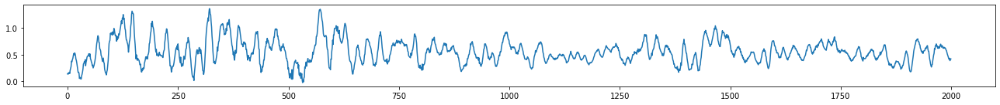

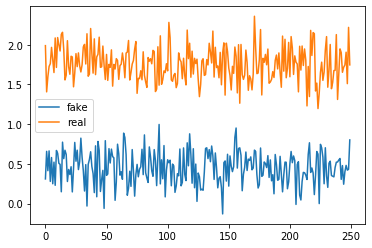

Epoch: 26 	 Discriminator Loss: [-0.67283875, 0.006] 		 Generator Loss: -0.03182784467935562
Epoch: 27 	 Discriminator Loss: [-0.66969544, 0.0] 		 Generator Loss: -0.06993693858385086
Epoch: 28 	 Discriminator Loss: [-0.6721006, 0.0] 		 Generator Loss: 0.12069602310657501
Epoch: 29 	 Discriminator Loss: [-0.6365093, 0.004] 		 Generator Loss: -0.2287137508392334
Epoch: 30 	 Discriminator Loss: [-0.54336554, 0.0] 		 Generator Loss: -3.495277166366577


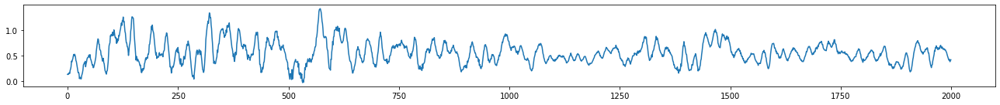

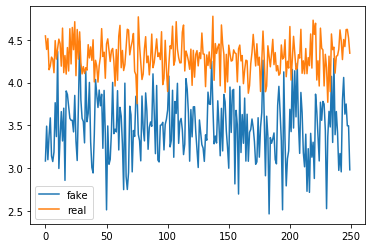

Epoch: 31 	 Discriminator Loss: [-0.6341118, 0.012] 		 Generator Loss: 0.15245085954666138
Epoch: 32 	 Discriminator Loss: [-0.4273981, 0.5] 		 Generator Loss: -2.729766607284546
Epoch: 33 	 Discriminator Loss: [-0.6148995, 0.0] 		 Generator Loss: -0.1508703976869583
Epoch: 34 	 Discriminator Loss: [-0.60224944, 0.01] 		 Generator Loss: -0.1714312881231308
Epoch: 35 	 Discriminator Loss: [-0.59484124, 0.24] 		 Generator Loss: -0.3705736994743347


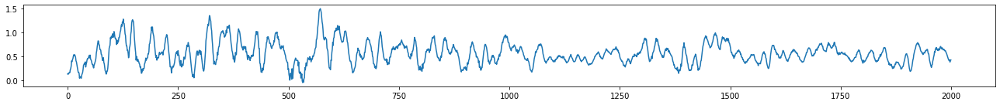

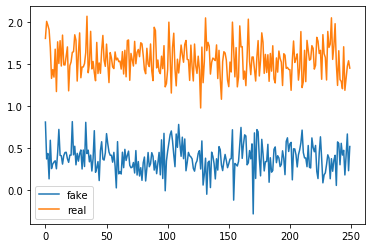

Epoch: 36 	 Discriminator Loss: [-0.42968732, 0.5] 		 Generator Loss: -2.2740931510925293
Epoch: 37 	 Discriminator Loss: [-0.58360595, 0.008] 		 Generator Loss: -0.3655751943588257
Epoch: 38 	 Discriminator Loss: [-0.5802985, 0.07] 		 Generator Loss: -0.2897711396217346
Epoch: 39 	 Discriminator Loss: [-0.45656937, 0.5] 		 Generator Loss: -0.44245585799217224
Epoch: 40 	 Discriminator Loss: [-0.43083698, 0.5] 		 Generator Loss: -0.5260465741157532


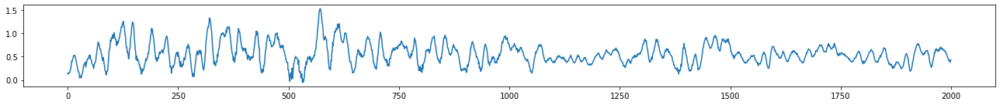

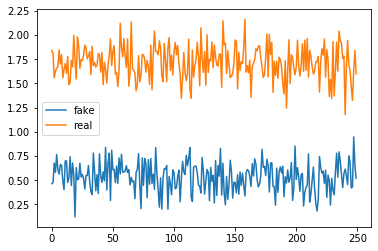

Epoch: 41 	 Discriminator Loss: [-0.5895641, 0.004] 		 Generator Loss: -0.12228989601135254
Epoch: 42 	 Discriminator Loss: [-0.5882964, 0.0] 		 Generator Loss: 0.20258276164531708
Epoch: 43 	 Discriminator Loss: [-0.58480644, 0.0] 		 Generator Loss: 0.5387299060821533
Epoch: 44 	 Discriminator Loss: [-0.3904064, 0.5] 		 Generator Loss: -1.9286481142044067
Epoch: 45 	 Discriminator Loss: [-0.2707431, 0.5] 		 Generator Loss: -3.0027735233306885


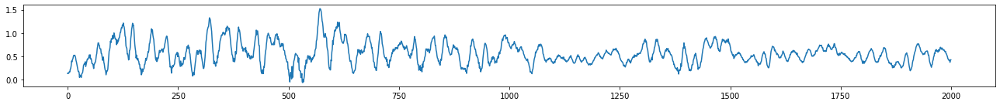

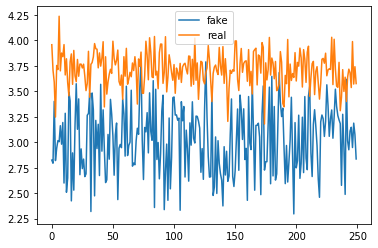

Epoch: 46 	 Discriminator Loss: [-0.395571, 0.0] 		 Generator Loss: -3.3437414169311523
Epoch: 47 	 Discriminator Loss: [-0.56299, 0.008] 		 Generator Loss: -0.08757256716489792
Epoch: 48 	 Discriminator Loss: [-0.5655554, 0.0] 		 Generator Loss: 0.3569989502429962
Epoch: 49 	 Discriminator Loss: [-0.53356814, 0.208] 		 Generator Loss: -0.2774518132209778
Epoch: 50 	 Discriminator Loss: [-0.5431184, 0.0] 		 Generator Loss: 0.12811177968978882


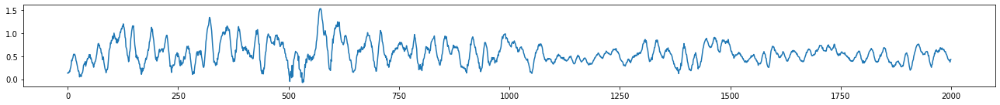

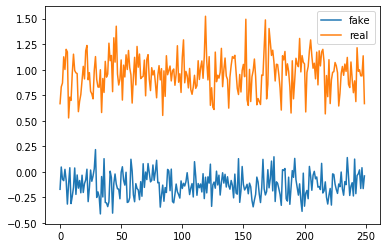

Epoch: 51 	 Discriminator Loss: [-0.5252029, 0.036] 		 Generator Loss: -0.23660366237163544
Epoch: 52 	 Discriminator Loss: [-0.54089975, 0.0] 		 Generator Loss: -0.9628381133079529
Epoch: 53 	 Discriminator Loss: [-0.540239, 0.0] 		 Generator Loss: 0.26797449588775635
Epoch: 54 	 Discriminator Loss: [-0.5400419, 0.0] 		 Generator Loss: 0.5794031620025635
Epoch: 55 	 Discriminator Loss: [-0.5342894, 0.0] 		 Generator Loss: -1.4213906526565552


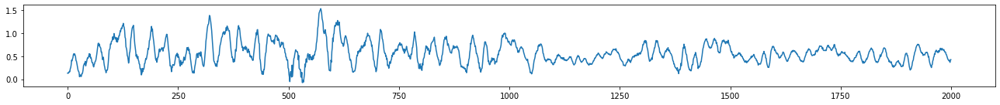

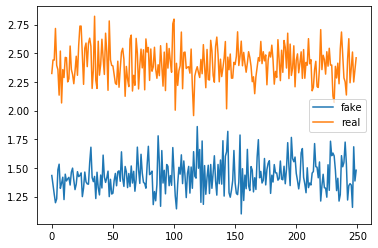

Epoch: 56 	 Discriminator Loss: [-0.24354693, 0.5] 		 Generator Loss: -2.787220001220703
Epoch: 57 	 Discriminator Loss: [-0.5378054, 0.0] 		 Generator Loss: 0.1322430968284607
Epoch: 58 	 Discriminator Loss: [-0.5262303, 0.0] 		 Generator Loss: 0.30771490931510925
Epoch: 59 	 Discriminator Loss: [-0.48190492, 0.5] 		 Generator Loss: 1.0703833103179932
Epoch: 60 	 Discriminator Loss: [-0.4579222, 0.5] 		 Generator Loss: 1.0919395685195923


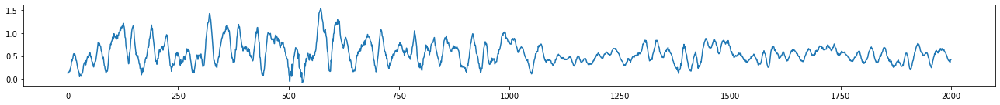

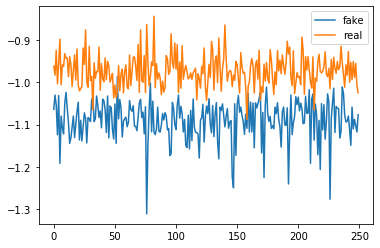

Epoch: 61 	 Discriminator Loss: [-0.52575535, 0.0] 		 Generator Loss: 0.019346056506037712
Epoch: 62 	 Discriminator Loss: [-0.5219477, 0.0] 		 Generator Loss: -0.02843436412513256
Epoch: 63 	 Discriminator Loss: [-0.5364206, 0.0] 		 Generator Loss: -0.10989965498447418
Epoch: 64 	 Discriminator Loss: [-0.555063, 0.0] 		 Generator Loss: 0.06489042937755585
Epoch: 65 	 Discriminator Loss: [-0.5931657, 0.0] 		 Generator Loss: 0.32702597975730896


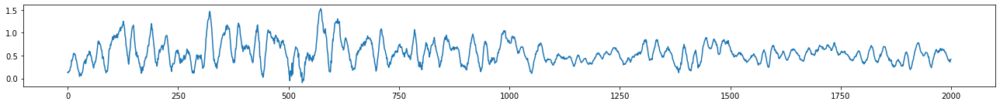

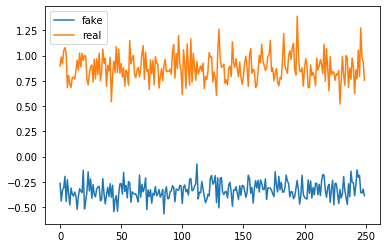

Epoch: 66 	 Discriminator Loss: [-0.60780126, 0.0] 		 Generator Loss: 0.1272854059934616
Epoch: 67 	 Discriminator Loss: [-0.62106997, 0.002] 		 Generator Loss: 0.021448785439133644
Epoch: 68 	 Discriminator Loss: [-0.6132683, 0.336] 		 Generator Loss: -0.6328960061073303
Epoch: 69 	 Discriminator Loss: [-0.61816317, 0.5] 		 Generator Loss: 0.5519763827323914
Epoch: 70 	 Discriminator Loss: [-0.62826806, 0.026] 		 Generator Loss: -0.5364413857460022


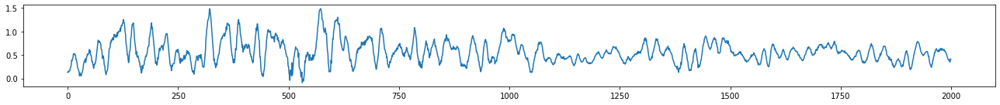

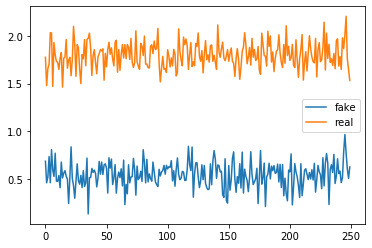

Epoch: 71 	 Discriminator Loss: [-0.6231237, 0.094] 		 Generator Loss: 0.2054668515920639
Epoch: 72 	 Discriminator Loss: [-0.6081056, 0.034] 		 Generator Loss: -0.4227844774723053
Epoch: 73 	 Discriminator Loss: [-0.61277723, 0.002] 		 Generator Loss: -0.2810622751712799
Epoch: 74 	 Discriminator Loss: [-0.60461414, 0.008] 		 Generator Loss: -0.1749991476535797
Epoch: 75 	 Discriminator Loss: [-0.28927916, 0.5] 		 Generator Loss: -1.97336745262146


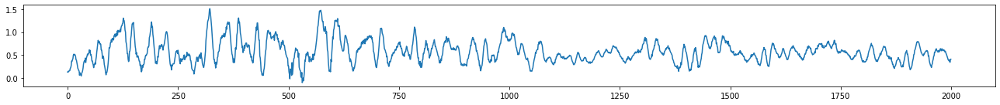

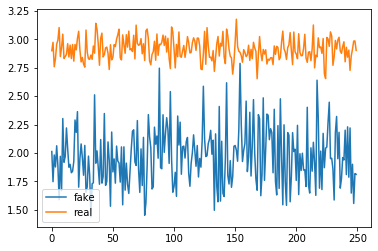

Epoch: 76 	 Discriminator Loss: [-0.60911816, 0.0] 		 Generator Loss: 0.3202487528324127
Epoch: 77 	 Discriminator Loss: [-0.6164027, 0.06] 		 Generator Loss: 0.019587870687246323
Epoch: 78 	 Discriminator Loss: [-0.60456675, 0.062] 		 Generator Loss: 0.06933903694152832
Epoch: 79 	 Discriminator Loss: [-0.22643921, 0.5] 		 Generator Loss: -3.588331699371338
Epoch: 80 	 Discriminator Loss: [-0.60238004, 0.0] 		 Generator Loss: -1.019809603691101


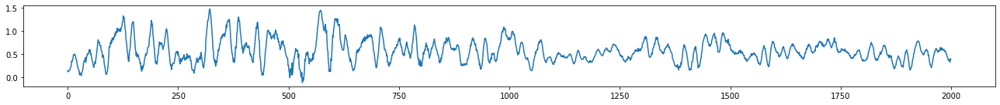

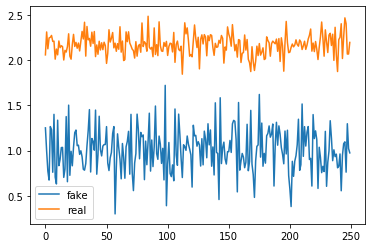

Epoch: 81 	 Discriminator Loss: [-0.22484562, 0.5] 		 Generator Loss: -3.909980535507202
Epoch: 82 	 Discriminator Loss: [-0.59035766, 0.0] 		 Generator Loss: -0.5662270784378052
Epoch: 83 	 Discriminator Loss: [-0.56700104, 0.5] 		 Generator Loss: -1.3711323738098145
Epoch: 84 	 Discriminator Loss: [-0.5899245, 0.02] 		 Generator Loss: 0.00875601451843977
Epoch: 85 	 Discriminator Loss: [-0.57457453, 0.264] 		 Generator Loss: -0.4334622025489807


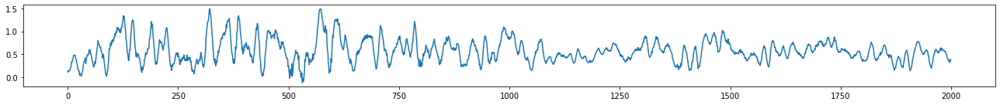

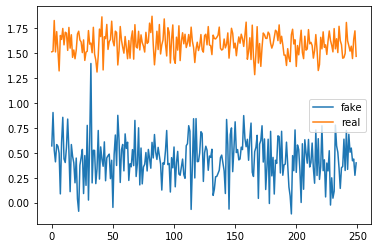

Epoch: 86 	 Discriminator Loss: [-0.56187576, 0.136] 		 Generator Loss: 0.35619843006134033
Epoch: 87 	 Discriminator Loss: [-0.09029988, 0.0] 		 Generator Loss: -0.7355175614356995
Epoch: 88 	 Discriminator Loss: [-0.44015497, 0.5] 		 Generator Loss: 0.5736397504806519
Epoch: 89 	 Discriminator Loss: [-0.5335902, 0.5] 		 Generator Loss: 0.8085980415344238
Epoch: 90 	 Discriminator Loss: [-0.53207165, 0.0] 		 Generator Loss: -2.395571231842041


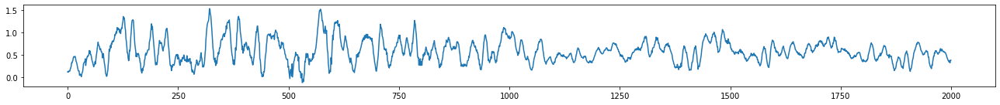

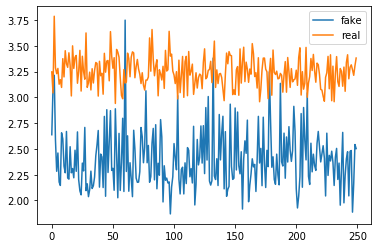

Epoch: 91 	 Discriminator Loss: [-0.5344414, 0.0] 		 Generator Loss: -0.7248426079750061
Epoch: 92 	 Discriminator Loss: [-0.35111862, 0.5] 		 Generator Loss: -1.7610305547714233
Epoch: 93 	 Discriminator Loss: [-0.53456557, 0.5] 		 Generator Loss: -0.7422063946723938
Epoch: 94 	 Discriminator Loss: [-0.52063143, 0.498] 		 Generator Loss: 0.3513220250606537
Epoch: 95 	 Discriminator Loss: [-0.35556704, 0.5] 		 Generator Loss: -2.748971462249756


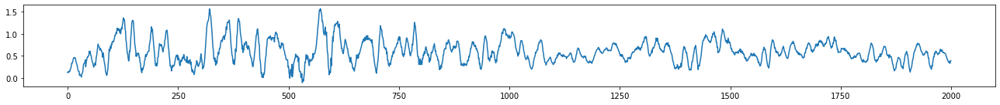

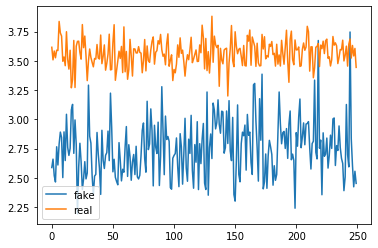

Epoch: 96 	 Discriminator Loss: [-0.5433482, 0.07] 		 Generator Loss: -0.6813256144523621
Epoch: 97 	 Discriminator Loss: [-0.5368262, 0.36] 		 Generator Loss: -0.8867992758750916
Epoch: 98 	 Discriminator Loss: [-0.4702273, 0.5] 		 Generator Loss: 0.875167727470398
Epoch: 99 	 Discriminator Loss: [-0.53091186, 0.276] 		 Generator Loss: -0.19468826055526733
Epoch: 100 	 Discriminator Loss: [-0.52923197, 0.11] 		 Generator Loss: -0.503510594367981


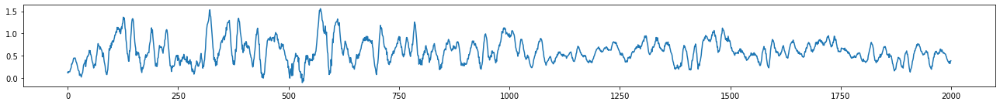

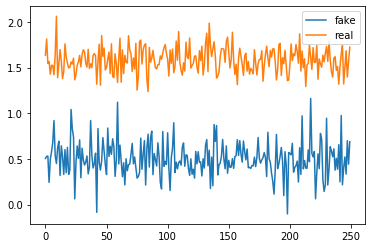

Epoch: 101 	 Discriminator Loss: [-0.51188123, 0.494] 		 Generator Loss: 0.656326174736023
Epoch: 102 	 Discriminator Loss: [-0.52412593, 0.24] 		 Generator Loss: 0.35758012533187866


In [ ]:
batch_size = 250
train_gan(epochs=400, batch_size=batch_size, gen=gen, disc=disc, gan=gan, train_ratio=10, disc_losses=disc_losses, gen_losses=gen_losses)

In [ ]:
valid = -np.ones((batch_size, 1))
fake = np.ones((batch_size, 1))
disc_labels = np.concatenate((valid, fake))
fake

# Testing

In [58]:
noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
disc.evaluate(gen.predict(noise),np.array([-1.]*batch_size))
disc.evaluate(db_train[np.random.randint(len(db_train[:,0,0]),size=batch_size)],np.ones(batch_size))

250/250 [==============================] - 0s 86us/sample - loss: -0.0096 - acc: 0.0000e+00


[-0.009590114757418633, 0.0]

In [59]:
#disc.predict(gen.predict(noise))
#disc.predict(db_train[np.random.randint(50000*(1-validation_split),size=batch_size)])

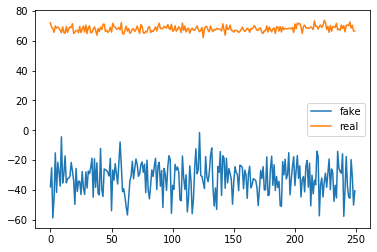

In [30]:
noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
plt.plot(disc.predict(gen.predict(noise)), label='fake')
plt.plot(disc.predict(db_train[np.random.randint(50000*(1-validation_split),size=batch_size)]), label='real')
plt.legend()
plt.show()

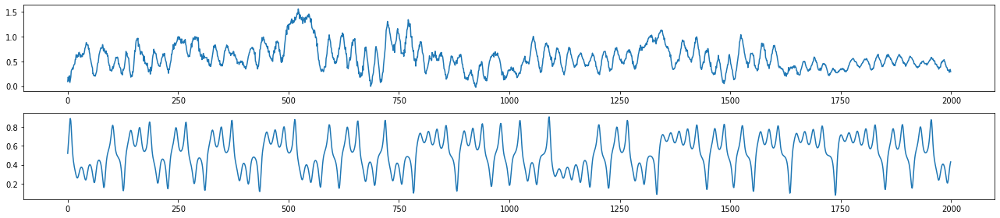

In [63]:
static_noise = np.random.normal(0, 1, size=(1, noise_dim))
plot_trajs(static_noise, db_train)

# Saving

In [64]:
#disc.save('wgan_disc.h5')
#gen.save('wgan_gen.0.h5')
#from tensorflow.keras.models import load_model
#gen = load_model('gan_gen_2.0.h5')